In [51]:
import json
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
from matplotlib.ticker import ScalarFormatter
from matplotlib.legend_handler import HandlerLine2D, HandlerPatch
from matplotlib.patches import Rectangle
from sklearn.metrics import confusion_matrix
from matplotlib.collections import PolyCollection
from matplotlib.patches import Patch
import seaborn as sns
import anndata
import torch
from tqdm import tqdm
import os

In [52]:
# Get current directory of notebook
current_dir = os.getcwd()
print(f"Current working directory: {current_dir}")

output_dir = f'{current_dir}/Figures'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

print(f"Output directory: {output_dir}")

def disable_clipping(ax):
    """
    Recursively disables clipping for all artists in the given axes.
    This helps prevent the creation of excessive clipping masks in Illustrator.
    """
    for artist in ax.get_children():
        artist.set_clip_on(False)
        if hasattr(artist, 'get_children'):
            disable_clipping(artist)

Current working directory: /home/zach/PythonRepos/Design/Design/Results
Output directory: /home/zach/PythonRepos/Design/Design/Results/Figures


# Completed Figures

In [53]:
results = json.load(open(f'{current_dir}/results.json'))
measured_adata_path = ''
def filter_runs(runs,pattern):
        for key,value in pattern.items():
            if runs[key] != value:
                return False
        return True
# Set Dynamic Range to 10^4 
for run,run_result in results.items():
    # Set Dynamic Range to 10^4 
    run_result['results']['Dynamic Range'] = run_result['results']['Dynamic Range']/10000
    # Set Number of Probes to 10^3
    run_result['results']['Probes'] = run_result['results']['Probes']/1000
    # Set Number of Probes to 10^3
    run_result['parameters']['n_probes'] = str(int(float(run_result['parameters']['n_probes'])/1000))

figure_colors = {
    'CIPHER':'00ffff99',
    'DPNMF':'33333399',
    'X':'950090ff',
    'E':'00ccccff',
    'P':'e59a00ff',
    'Probes':'000000ff',
    'Dynamic':'008000ff',
    'Separation':'0000a6ff',
    'Accuracy':'b20000ff',
    'Other1':'000000ff',
    'Other2':'808080ff',
    'Other3':'e600d9ff',
    'Other4':'006366ff',
    'Other5':'664500ff',
    'Other6':'0b0066ff',
}
figure_colors['Dynamic Fold'] = figure_colors['Dynamic']
figure_colors['Dynamic Range'] = figure_colors['Dynamic']
figure_colors = {key:'#'+value for key,value in figure_colors.items()}

In [54]:
unique_figures = np.unique([run_result['parameters']['fig'] for run,run_result in results.items()])
unique_figures

array(['Bit Number Tradeoff', 'Bit Number Tradeoff (Accuracy Only)',
       'Bit Number Tradeoff (Gene Constraints Only)',
       'Bit Number Tradeoff (No Hybridization Constraints)',
       'Brightness Tradeoff (18 Bits)', 'Brightness Tradeoff (24 Bits)',
       'Brightness Tradeoff (36 Bits)', 'Brightness Tradeoff (48 Bits)',
       'Central Brain Bit Number 250k Probes',
       'Central Brain Bit Number 50k Probes', 'Decoder Complexity',
       'Decoder Complexity Bit Number Tradeoff', 'Dev Mouse Bit Number',
       'Lymph Bit Number', 'Measurability Loss Term Dynamic Only',
       'Measurability Loss Term Separability Only',
       'Probe Number Tradeoff (18 Bits)',
       'Probe Number Tradeoff (24 Bits)',
       'Probe Number Tradeoff (36 Bits)',
       'Probe Number Tradeoff (48 Bits)', 'Training Iterations Tradeoff',
       'test'], dtype='<U50')

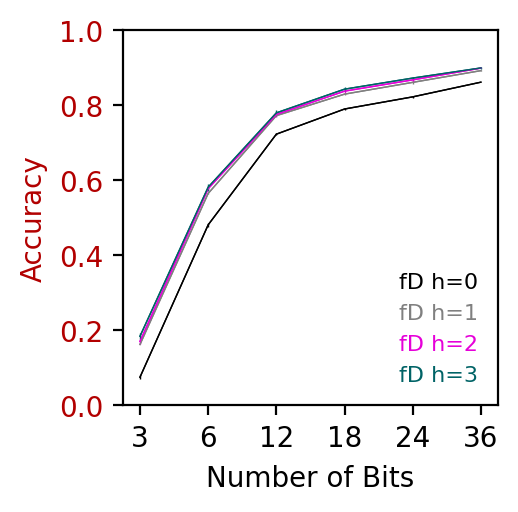

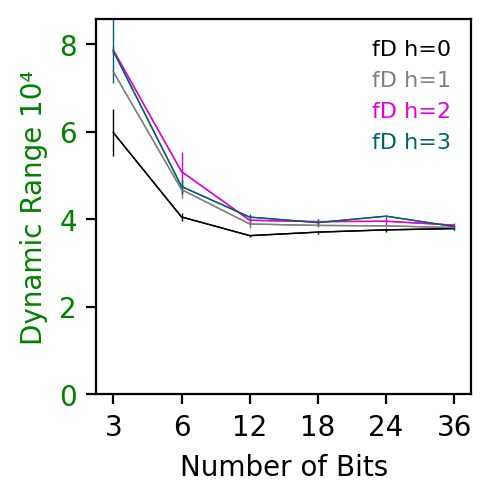

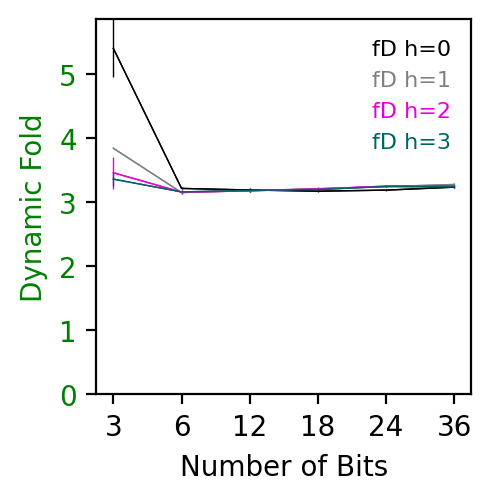

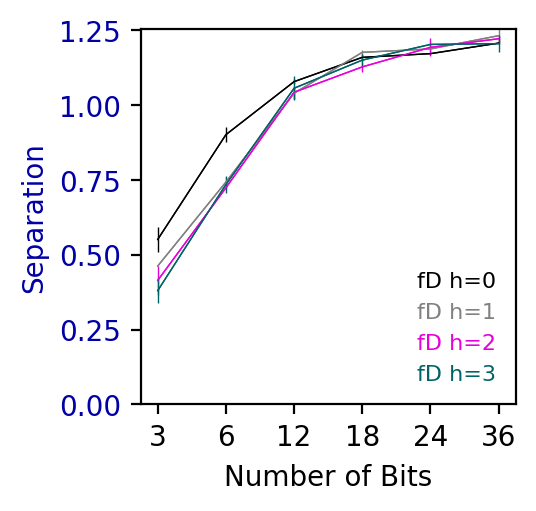

In [55]:
base_title = 'Decoder Complexity Bit Number Tradeoff'
x_axis = ('n_bit','Number of Bits',['3', '6', '12', '18', '24', '36'],None)
y_axis_dict = {
    'Accuracy':('Accuracy','Accuracy',None,(0,1)),
    'Dynamic Range':('Dynamic Range','Dynamic Range 10\u2074',None,None),
    'Dynamic Fold':('Dynamic Fold','Dynamic Fold',None,None),
    'Separation':('Separation','Separation',None,None),
    }

lines = {
'0': (f'fD h=0',figure_colors['Other1']), 
'1': (f'fD h=1',figure_colors['Other2']), 
'2': (f'fD h=2',figure_colors['Other3']),
'3': (f'fD h=3',figure_colors['Other4']),
}
for metric,y_axis in y_axis_dict.items():
    title = f'{base_title} {metric}'
    plt.figure(figsize=(2.5,2.5), dpi=200)
    plt.axes([0.2, 0.2, 0.75, 0.75])
    pattern = {}
    # pattern['decoder_n_lyr'] = '0'
    pattern['fig'] = 'Decoder Complexity Bit Number Tradeoff'
    Y_max = 0
    for line,line_info in lines.items():
        pattern['decoder_n_lyr'] = line
        Y_mu = []
        Y_std = []
        X = []
        matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
        x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
        y_axis_values = np.array([results[run]['results'][y_axis[0]] for run in matching_runs])
        mask = [i in x_axis[2] for i in x_axis_values]
        # print(line,len(matching_runs))
        matching_runs = matching_runs[mask]
        x_axis_values = x_axis_values[mask]
        y_axis_values = y_axis_values[mask]
        # print(matching_runs)
        for x_value in x_axis[2]:
            y = y_axis_values[x_axis_values == x_value]
            if len(y)==0:
                print(f'No data for {x_value}')
                continue
            # check for outliers
            if len(y)>1:
                y_mu = np.median(y)
                y_outliers = np.abs(y - y_mu) > y_mu*0.4
                if y_outliers.sum()>0:
                    print(f'Outliers for {x_value}')
                    print(matching_runs[x_axis_values == x_value][y_outliers])
                y = y[~y_outliers]
                if len(y)==0:
                    print(f'No data for {x_value}')
            # print(len(y))
            y_mu = np.mean(y)
            y_std = np.std(y)
            Y_mu.append(y_mu)
            Y_std.append(y_std)
            X.append(x_value)
        Y_mu = np.array(Y_mu)
        Y_std = np.array(Y_std)
        X = np.array(X)
        Y_max = max(Y_max,np.max(Y_mu + Y_std))
        plt.plot(X,Y_mu,label=line_info[0],color=line_info[1],linewidth=0.5)
        plt.errorbar(X,Y_mu,Y_std,alpha=1,color=line_info[1],linewidth=0.5)
    # plt.suptitle(title)
    plt.xlabel(x_axis[1])
    plt.ylabel(y_axis[1],color=figure_colors[y_axis[0]])
    if y_axis[3] is not None:
        plt.ylim(y_axis[3])
    else:
        plt.ylim(0,Y_max)
    if x_axis[3] is not None:
        plt.xlim(x_axis[3])
    plt.tick_params(axis='y',labelcolor=figure_colors[y_axis[0]])
    plt.legend(
        handlelength=0,
        labelcolor='linecolor',
        framealpha=0,
        fontsize=8,
        handletextpad=0
    )
    disable_clipping(plt.gca())
    plt.savefig(f'{output_dir}/{title.replace(" ","_")}.pdf',format='pdf')
    plt.show()

/tmp/ipykernel_68438/133230392.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


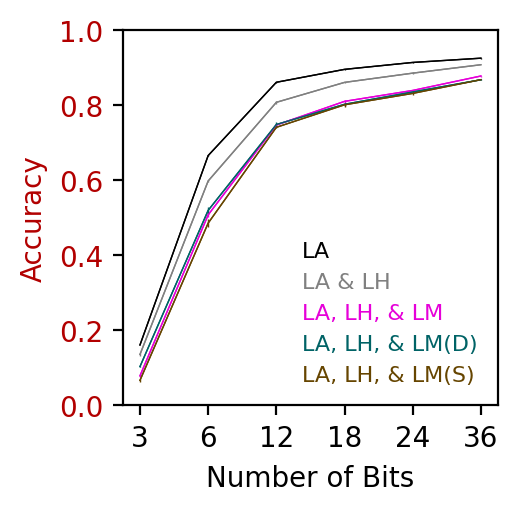

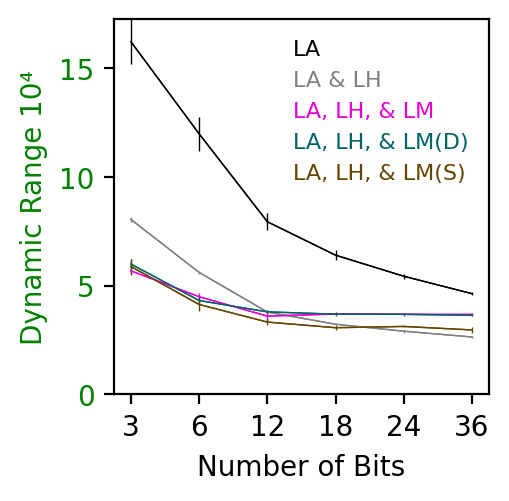

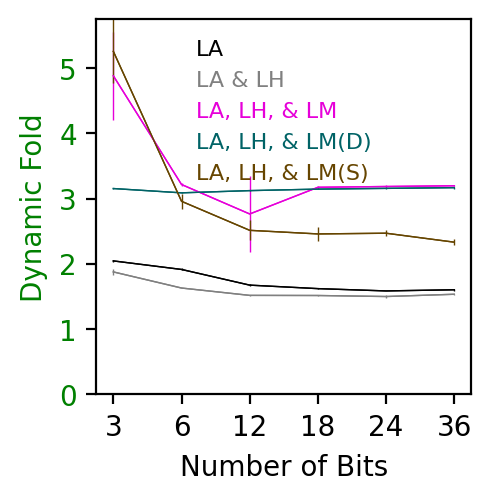

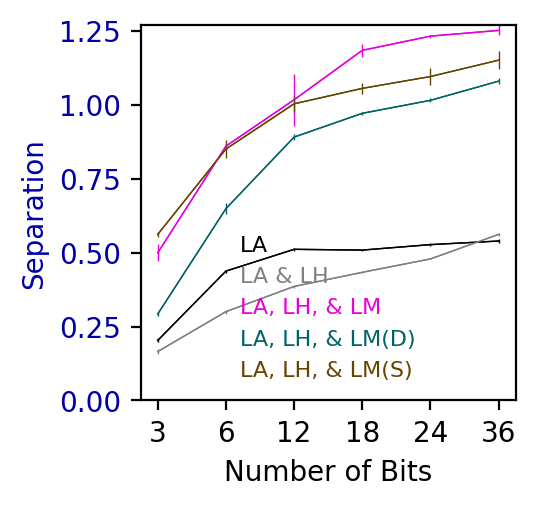

In [56]:
base_title = 'Need for Measurability'
x_axis = ('n_bit','Number of Bits',['3', '6', '12', '18', '24', '36'],None)
y_axis_dict = {
    'Accuracy':('Accuracy','Accuracy',None,(0,1)),
    'Dynamic Range':('Dynamic Range','Dynamic Range 10\u2074',None,None),
    'Dynamic Fold':('Dynamic Fold','Dynamic Fold',None,None),
    'Separation':('Separation','Separation',None,None),
    }

lines = {
'Bit Number Tradeoff (Accuracy Only)': ('LA',figure_colors['Other1']), 
'Bit Number Tradeoff (Gene Constraints Only)': ('LA & LH',figure_colors['Other2']), 
'Bit Number Tradeoff': ('LA, LH, & LM',figure_colors['Other3']),
'Measurability Loss Term Dynamic Only': ('LA, LH, & LM(D)',figure_colors['Other4']),
'Measurability Loss Term Separability Only': ('LA, LH, & LM(S)',figure_colors['Other5']),
}
for metric,y_axis in y_axis_dict.items():
    title = f'{base_title} {metric}'
    plt.figure(figsize=(2.5,2.5), dpi=200)
    plt.axes([0.2, 0.2, 0.75, 0.75])
    pattern = {}
    pattern['decoder_n_lyr'] = '0'
    Y_max = 0
    for line,line_info in lines.items():
        pattern['fig'] = line
        Y_mu = []
        Y_std = []
        X = []
        matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
        x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
        y_axis_values = np.array([results[run]['results'][y_axis[0]] for run in matching_runs])
        mask = [i in x_axis[2] for i in x_axis_values]
        # print(line,len(matching_runs))
        matching_runs = matching_runs[mask]
        x_axis_values = x_axis_values[mask]
        y_axis_values = y_axis_values[mask]
        for x_value in x_axis[2]:
            y = y_axis_values[x_axis_values == x_value]
            if len(y)==0:
                print(f'No data for {x_value}')
                continue
            # print(len(y))
            y_mu = np.mean(y)
            y_std = np.std(y)
            Y_mu.append(y_mu)
            Y_std.append(y_std)
            X.append(x_value)
        Y_mu = np.array(Y_mu)
        Y_std = np.array(Y_std)
        X = np.array(X)
        Y_max = max(Y_max,np.max(Y_mu + Y_std))
        plt.plot(X,Y_mu,label=line_info[0],color=line_info[1],linewidth=0.5)
        plt.errorbar(X,Y_mu,Y_std,alpha=1,color=line_info[1],linewidth=0.5)
    # plt.suptitle(title)
    plt.xlabel(x_axis[1])
    plt.ylabel(y_axis[1],color=figure_colors[y_axis[0]])
    if y_axis[3] is not None:
        plt.ylim(y_axis[3])
    else:
        plt.ylim(0,Y_max)
    if x_axis[3] is not None:
        plt.xlim(x_axis[3])
    plt.tick_params(axis='y',labelcolor=figure_colors[y_axis[0]])
    plt.legend(
        handlelength=0,
        labelcolor='linecolor',
        framealpha=0,
        fontsize=8,
        handletextpad=0
    )
    plt.tight_layout()
    disable_clipping(plt.gca())
    plt.savefig(f'{output_dir}/{title.replace(" ","_")}.pdf',format='pdf')
    plt.show()

/tmp/ipykernel_68438/1017514342.py:87: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


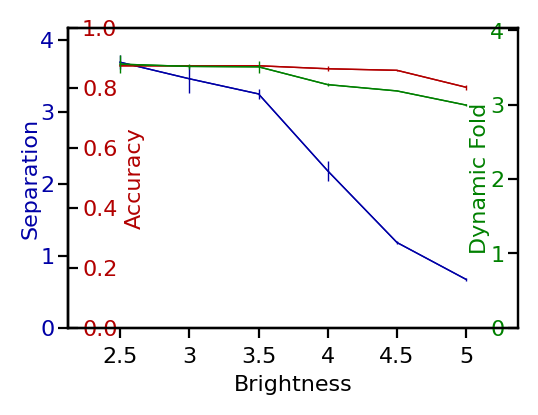

In [57]:
pattern = {}
pattern['decoder_n_lyr'] = '1'
pattern['n_bit'] = '18'
pattern['fig'] = 'Brightness Tradeoff (18 Bits)'#'Probe Number Tradeoff (18 Bits)'
matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
x_axis = ('brightness_s','Brightness',['2.5', '3', '3.5', '4', '4.5', '5'])#('n_probes','Number of Probes')
x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
mask = np.array([i in x_axis[2] for i in x_axis_values])
matching_runs = matching_runs[mask]
x_axis_values = x_axis_values[mask]
y_axis_parameters = ['Probes','Accuracy','Separation','Dynamic Fold']
color_mapper = {
    'Probes': figure_colors['Probes'],
    'Accuracy': figure_colors['Accuracy'],
    'Separation': figure_colors['Separation'],
    'Dynamic Fold': figure_colors['Dynamic Fold']}
x_axis_label_mapper = {
    'n_bit':'Number of Bits',
    'separation_wt':'Separation Weight',
    'brightness_s':'Brightness (Log10)',
    'n_probes': 'Number of Encoding Probes'}
y_axis_label_mapper = {
    'Probes': 'Number of Probes',
    'Accuracy': 'Accuracy',
    'Separation': 'Separation',
    'Dynamic Fold': 'Dynamic Fold'}

mu_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
std_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
for x_value in x_axis[2]:
    temp_mask = np.array(x_axis_values == x_value)
    temp_runs = matching_runs[temp_mask]
    for y_axis_parameter in y_axis_parameters:
        mu_df.loc[x_value,y_axis_parameter] = np.mean([results[run]['results'][y_axis_parameter] for run in temp_runs])
        std_df.loc[x_value,y_axis_parameter] = np.std([results[run]['results'][y_axis_parameter] for run in temp_runs])
labelfontsize=8
fig = plt.figure(figsize=(3,2), dpi=200)
axs = plt.axes([0.2, 0.2, 0.75, 0.75])
x_axis_values = mu_df.index
x_pos = np.arange(len(x_axis_values))
# plt.suptitle(f'Brightness Tradeoff')
main_ax = axs
for j,y_axis_parameter in enumerate(['Separation','Accuracy','Dynamic Fold']):
    if j == 0: # left y axis, left ticks, left labels
        ax = main_ax
        ax.yaxis.set_ticks_position('left')
        ax.yaxis.set_label_position('left')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=0, va='bottom', fontsize=labelfontsize)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_axis_values, fontsize=labelfontsize)
        ax.set_xlim(min(x_pos)-0.75,max(x_pos)+0.75)
        ax.set_xlabel(x_axis[1], labelpad=10, va='bottom', fontsize=labelfontsize)
    else:
        ax = main_ax.twinx()
    if j==1: # left y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['right'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom', fontsize=labelfontsize)
    elif j==2: # right y axis, left ticks, left labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], direction='in', pad=-10, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=-10, va='bottom', fontsize=labelfontsize)
    elif j==3: # right y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['left'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom', fontsize=labelfontsize)
    # if y_axis_parameter in ['Probes','Dynamic Range']:
    #     ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    #     ax.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
    if y_axis_parameter == 'Accuracy':
        ax.set_ylim(0,1)
    else:
        y_max = (mu_df[y_axis_parameter] + std_df[y_axis_parameter]).max() * 1.1
        y_min = 0
        ax.set_ylim(y_min,y_max)
    # bar_position = x_pos + j*total_bar_width/len(y_axis_parameters) - 0.4 + 0.8/len(y_axis_parameters)/2
    ax.plot(x_pos, mu_df[y_axis_parameter], color=color_mapper[y_axis_parameter],linewidth=0.5)
    # error bars
    ax.errorbar(x_pos, mu_df[y_axis_parameter], yerr=std_df[y_axis_parameter], color=color_mapper[y_axis_parameter],linewidth=0.5)

plt.tight_layout()
disable_clipping(plt.gca())
# set background to transparent
# fig.patch.set_facecolor('none')
# for char in [' ','(',')','=','+','-','*','/','^','%']:
#     figure = figure.replace(char,'_')
plt.savefig(f'{output_dir}/Brightness_Tradeoff.pdf',format='pdf')
plt.show()

/tmp/ipykernel_68438/2177582525.py:87: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


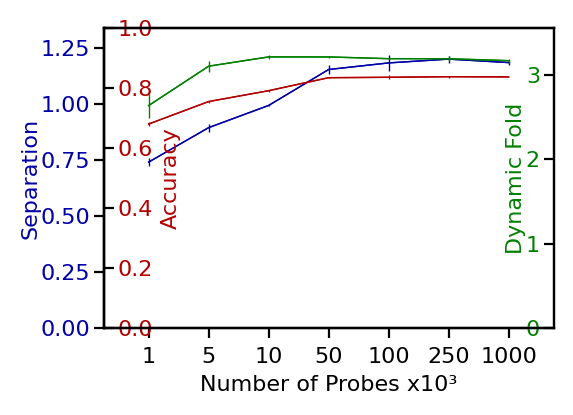

In [58]:
pattern = {}
pattern['decoder_n_lyr'] = '1'
pattern['n_bit'] = '18'
pattern['fig'] = 'Probe Number Tradeoff (18 Bits)'
matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
x_axis = ('n_probes',f'Number of Probes x10\u00B3',['1', '5', '10', '50','100', '250','1000'])
x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
mask = np.array([i in x_axis[2] for i in x_axis_values])
matching_runs = matching_runs[mask]
x_axis_values = x_axis_values[mask]
y_axis_parameters = ['Probes','Accuracy','Separation','Dynamic Fold']
color_mapper = {
    'Probes': figure_colors['Probes'],
    'Accuracy': figure_colors['Accuracy'],
    'Separation': figure_colors['Separation'],
    'Dynamic Fold': figure_colors['Dynamic Fold']}
x_axis_label_mapper = {
    'n_bit':'Number of Bits',
    'separation_wt':'Separation Weight',
    'brightness_s':'Brightness (Log10)',
    'n_probes': 'Number of Encoding Probes'}
y_axis_label_mapper = {
    'Probes': 'Number of Probes',
    'Accuracy': 'Accuracy',
    'Separation': 'Separation',
    'Dynamic Fold': 'Dynamic Fold'}

mu_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
std_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
for x_value in x_axis[2]:
    temp_mask = np.array(x_axis_values == x_value)
    temp_runs = matching_runs[temp_mask]
    for y_axis_parameter in y_axis_parameters:
        mu_df.loc[x_value,y_axis_parameter] = np.mean([results[run]['results'][y_axis_parameter] for run in temp_runs])
        std_df.loc[x_value,y_axis_parameter] = np.std([results[run]['results'][y_axis_parameter] for run in temp_runs])
labelfontsize=8
fig = plt.figure(figsize=(3,2), dpi=200)
axs = plt.axes([0.2, 0.2, 0.75, 0.75])
x_axis_values = mu_df.index
x_pos = np.arange(len(x_axis_values))
# plt.suptitle(f'Probe Number Tradeoff')
main_ax = axs
for j,y_axis_parameter in enumerate(['Separation','Accuracy','Dynamic Fold']):
    if j == 0: # left y axis, left ticks, left labels
        ax = main_ax
        ax.yaxis.set_ticks_position('left')
        ax.yaxis.set_label_position('left')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=0, va='bottom', fontsize=labelfontsize)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_axis_values, fontsize=labelfontsize)
        ax.set_xlim(min(x_pos)-0.75,max(x_pos)+0.75)
        ax.set_xlabel(x_axis[1], labelpad=10, va='bottom', fontsize=labelfontsize)
    else:
        ax = main_ax.twinx()
    if j==1: # left y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['right'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom', fontsize=labelfontsize)
    elif j==2: # right y axis, left ticks, left labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], direction='in', pad=-10, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=-10, va='bottom', fontsize=labelfontsize)
    elif j==3: # right y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['left'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom', fontsize=labelfontsize)
    # if y_axis_parameter in ['Probes','Dynamic Range']:
    #     ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    #     ax.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
    if y_axis_parameter == 'Accuracy':
        ax.set_ylim(0,1)
    else:
        y_max = (mu_df[y_axis_parameter] + std_df[y_axis_parameter]).max() * 1.1
        y_min = 0
        ax.set_ylim(y_min,y_max)
    # bar_position = x_pos + j*total_bar_width/len(y_axis_parameters) - 0.4 + 0.8/len(y_axis_parameters)/2
    ax.plot(x_pos, mu_df[y_axis_parameter], color=color_mapper[y_axis_parameter],linewidth=0.5)
    # error bars
    ax.errorbar(x_pos, mu_df[y_axis_parameter], yerr=std_df[y_axis_parameter], color=color_mapper[y_axis_parameter],linewidth=0.5)

plt.tight_layout()
disable_clipping(plt.gca())
# set background to transparent
# fig.patch.set_facecolor('none')
# for char in [' ','(',')','=','+','-','*','/','^','%']:
#     figure = figure.replace(char,'_')
plt.savefig(f'{output_dir}/Probe_Number_Tradeoff.pdf',format='pdf')
plt.show()

/tmp/ipykernel_68438/1187612384.py:89: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0.03, 1, 0.95])


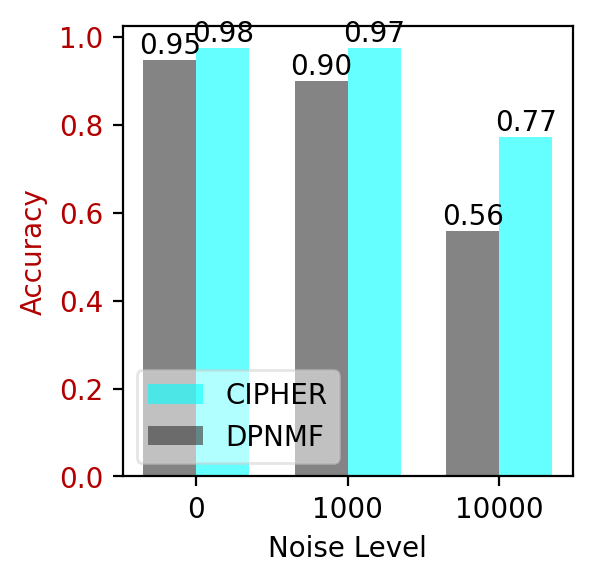

In [59]:
summarized_results = {}
file = '/scratchdata1/GeneralStorage/Zach/Designs/Sync/TreeDPNMF_18bit/Simulation/Results/TreeDPNMF_18bit.json'
dataset = 'TreeDPNMF_18bit'
temp_results = json.load(open(file,'r'))
temp_results = {k.replace(dataset,''):round(v,3) for k,v in temp_results.items()}
summarized_results['DPNMF'] = temp_results

file = '/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1/Simulation/Results/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1.json'
dataset = 'params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1'
temp_results = json.load(open(file,'r'))
temp_results = {k.replace(dataset,''):round(v,3) for k,v in temp_results.items()}
summarized_results['CIPHER'] = temp_results
temp_results = {}
for dataset in summarized_results.keys():
    temp_results[dataset] = {}
    for k,v in summarized_results[dataset].items():
        model = k.split('_')[0]
        noise = k.split('.')[0].split('_')[-1]
        if 'likelihood_only' in k:
            prior = 'F'
        else:
            prior = 'F+S'
        k = f'{model} {noise} {prior}'
        if noise == '100000':
            continue
        temp_results[dataset][k] = v

data = temp_results
records = []
for encoder, values in data.items():
    for key, accuracy in values.items():
        decoder, noise, state = key.split()
        if state == 'F+S':
            state = 'F+S'
        records.append([encoder, decoder, int(noise), state, accuracy])

df = pd.DataFrame(records, columns=['Encoder', 'Decoder', 'Noise', 'State', 'Accuracy'])

# fig, axes = plt.subplots(1,1, figsize=(10, 10), sharey=True)
# ax = axes
plt.figure(figsize=(3,3), dpi=200)
plt.axes([0.2, 0.2, 0.75, 0.75])
# fig.suptitle('CIPHER vs. DPNMF Accuracy Across Different Conditions', fontsize=16)

decoders = ['MLP']
states = ['F+S']
state_converter = {'F': 'Feature Only', 'F+S': 'Feature & Spatial Prior'}
i = 0
j = 0
decoder = 'MLP'
state = 'F+S'

# for i, decoder in enumerate(decoders):
    # for j, state in enumerate(states):
title = f"Decoder: {decoder} SCALE {state_converter[state]}"
# ax = axes[i, j]
subset = df[(df['Decoder'] == decoder) & (df['State'] == state)]

noise_levels = sorted(subset['Noise'].unique())
x = np.arange(len(noise_levels))
width = 0.35

cipher_accuracies = subset[subset['Encoder'] == 'CIPHER'].set_index('Noise').reindex(noise_levels)['Accuracy']
dpnmf_accuracies = subset[subset['Encoder'] == 'DPNMF'].set_index('Noise').reindex(noise_levels)['Accuracy']

rects1 = plt.bar(x + width/2, cipher_accuracies, width, label='CIPHER', color=figure_colors['CIPHER'])
rects2 = plt.bar(x - width/2, dpnmf_accuracies, width, label='DPNMF', color=figure_colors['DPNMF'])
# Annotate bars with accuracy values
for rect1, rect2 in zip(rects1, rects2):
    height1 = rect1.get_height()
    height2 = rect2.get_height()
    plt.text(rect1.get_x() + rect1.get_width()/2, height1, f'{height1:.2f}', ha='center', va='bottom')
    plt.text(rect2.get_x() + rect2.get_width()/2, height2, f'{height2:.2f}', ha='center', va='bottom')

plt.ylabel('Accuracy',color=figure_colors['Accuracy'])
plt.yticks([0,0.2,0.4,0.6,0.8,1],color=figure_colors['Accuracy'])
plt.xticks(x,noise_levels)
plt.xlabel('Noise Level')
# plt.title(title)
# if (i==0)&(j==1):
#make legend transparent
plt.legend(framealpha=0.5,loc='lower left')

ax = plt.gca()
# ax.bar_label(rects1, padding=3)
# ax.bar_label(rects2, padding=3)

fig = plt.gcf()
fig.tight_layout(rect=[0, 0.03, 1, 0.95])
disable_clipping(plt.gca())
plt.savefig(f'{output_dir}/Simulation_accuracy.pdf',bbox_inches='tight',format='pdf')
plt.show()

--- Confusion Matrix ---

Overall Accuracy: 0.9015
--- Confusion Matrix ---

Overall Accuracy: 0.9749


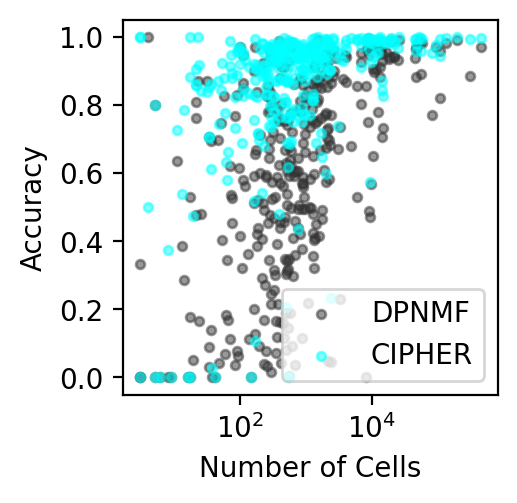

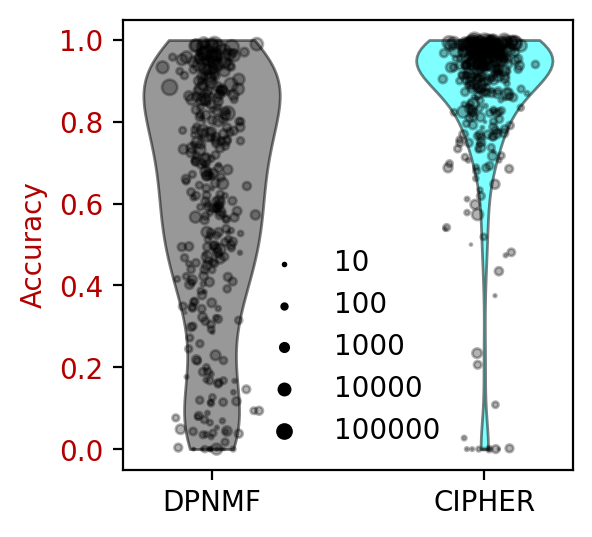

In [60]:
model = 'MLP'
noise = '1000.0'
files = {}
files['DPNMF'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/TreeDPNMF_18bit/Simulation/Results/{model}_TreeDPNMF_18bit_{noise}.h5ad"
files['CIPHER'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1/Simulation/Results/{model}_params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1_{noise}.h5ad"

temp_results = {}
n_cells = {}
# plt.figure(figsize=(5,5))
plt.figure(figsize=(2.5,2.5), dpi=200)
plt.axes([0.2, 0.2, 0.75, 0.75])
for dataset,file in files.items():
    adata = anndata.read_h5ad(file)
    converter = dict(zip(adata.obs['subclass'].unique(),adata.obs['subclass_color'].unique()))
    converter = {k[4:]:v for k,v in converter.items()}
    for ct in adata.obs['true_subclass'].unique():
        if not ct in converter.keys():
            converter[ct] = 'k'
    converter
    adata.obs['true_subclass_color'] = adata.obs['true_subclass'].map(converter)
    true_labels_ordered = np.array(adata.obs['true_subclass'])
    labels_order = np.unique(true_labels_ordered)
    predicted_labels_ordered = np.array(adata.obs['predicted_subclass'])
    cm = confusion_matrix(true_labels_ordered, predicted_labels_ordered, labels=labels_order)

    print("--- Confusion Matrix ---")
    # For a more readable output, especially with many classes, display it as a Pandas DataFrame
    cm_df = pd.DataFrame(cm, index=labels_order, columns=labels_order)
    cm_df.index.name = 'True Subclass'
    cm_df.columns.name = 'Predicted Subclass'
    # print(cm_df)

    # 4. Calculate and print the accuracy (as you had it)
    accuracy = np.mean(np.array(adata.obs['predicted_subclass']) == np.array(adata.obs['true_subclass']))
    # Alternatively, using sklearn's accuracy_score:
    # from sklearn.metrics import accuracy_score
    # accuracy_sk = accuracy_score(true_labels, predicted_labels)
    print(f"\nOverall Accuracy: {accuracy:.4f}")
    n_cells[dataset] = cm_df.sum(1).values
    cm_df = cm_df/np.array(cm_df.sum(1))[:,None]
    temp_results[dataset] = np.diag(cm_df).ravel()
    converter = {'CIPHER':figure_colors['CIPHER'],'DPNMF':figure_colors['DPNMF']}
    plt.scatter(n_cells[dataset],temp_results[dataset],label=dataset,color=converter[dataset],s=10,alpha=0.5)
    # plt.figure(figsize=(5,5))
    # plt.title(f'{dataset} Accuracy Distribution')
    # plt.hist(np.diag(cm_df).ravel(),bins=50,color='k')
    # plt.xlabel('Accuracy')
    # plt.ylabel('Cell Type Count')
    # plt.title('Accuracy Distribution')
    # plt.show()
plt.xlabel('Number of Cells')
plt.ylabel('Accuracy')
plt.xscale('log')
# plt.title('Cell Type Accuracy Scores')
plt.legend()
plt.show()

# fig, ax = plt.subplots(figsize=(6, 4))
# plt.figure(figsize=(6,4))
plt.figure(figsize=(3,3), dpi=200)
plt.axes([0.2, 0.2, 0.75, 0.75])
# Create the violin plot
parts = plt.violinplot([temp_results['DPNMF'],temp_results['CIPHER']], showmedians=False,showextrema=False)

# Customize violin colors
parts['bodies'][1].set_facecolor(figure_colors['CIPHER'])
parts['bodies'][0].set_facecolor(figure_colors['DPNMF'])
for pc in parts['bodies']:
    pc.set_edgecolor('black')
    pc.set_alpha(0.5)

# Add jittered points
for i, (model, data) in enumerate(temp_results.items()):
    # The x-axis location for this violin is i + 1
    x_coords = np.random.normal(0, 0.06, size=len(data))
    # x_coords  =x_coords*data
    s = np.log10(n_cells[model]+1)**2
    plt.scatter((i+1)+x_coords, data, s=s, alpha=0.3,c='k')
for size in [1,2,3,4,5]:
    plt.scatter([],[],s=size**2,alpha=1,c='k',label=f'{10**size}')
# ax.set_title('Cell Type Accuracy Scores')
plt.xticks([1, 2],['DPNMF','CIPHER'])
# plt.xticklabels(['DPNMF','CIPHER'])
plt.ylabel('Accuracy',color=figure_colors['Accuracy'])
plt.yticks([0,0.2,0.4,0.6,0.8,1],color=figure_colors['Accuracy'])
# ax.grid(True)
plt.legend(framealpha=0)# Transparent

# fig.tight_layout(rect=[0, 0.03, 1, 0.95])
disable_clipping(plt.gca())
plt.savefig(f'{output_dir}/Simulation_cell_typeaccuracy.pdf',bbox_inches='tight',format='pdf')
plt.show()

In [61]:
files = {}
files['CIPHER'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1/results/E_constrained.csv"
files['DPNMF'] = '/scratchdata1/GeneralStorage/Zach/Designs/Sync/TreeDPNMF_18bit/results/E_constrained.csv'
for dataset,file in files.items():
    E = pd.read_csv(file,index_col=0)
    E = E[E.sum(1)>0]
    print(E.shape)
    print(E.sum().sum())
    temp_E = E.copy()
    gene_bit_assignment = E.columns[np.argmax(E,axis=1)]
    order = []
    for bit in E.columns:
        bit_genes = np.array(E.index)[gene_bit_assignment==bit]


(1274, 18)
49445
(6133, 18)
31564


CIPHER


100%|██████████| 334/334 [02:34<00:00,  2.16it/s]


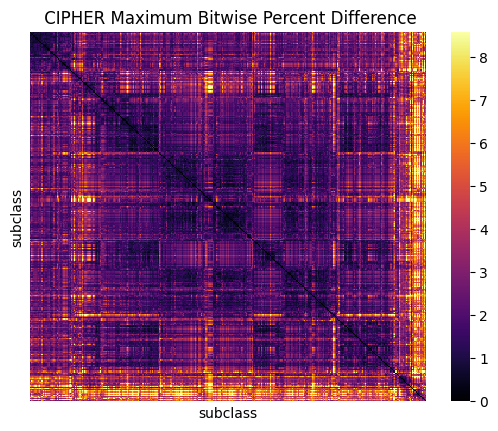

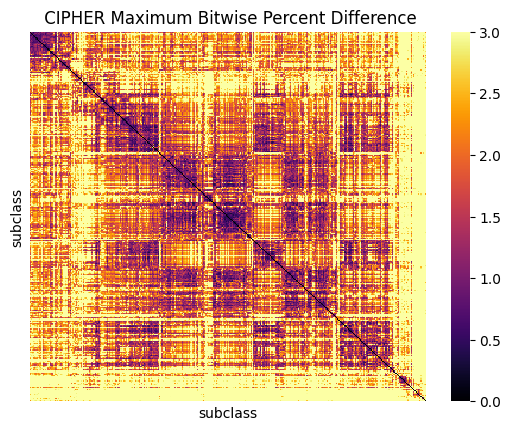

DPNMF


100%|██████████| 334/334 [02:38<00:00,  2.11it/s]


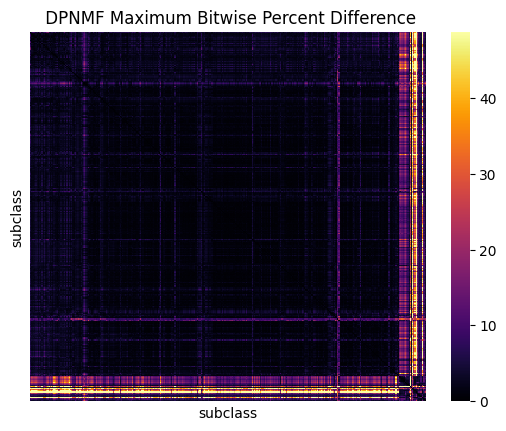

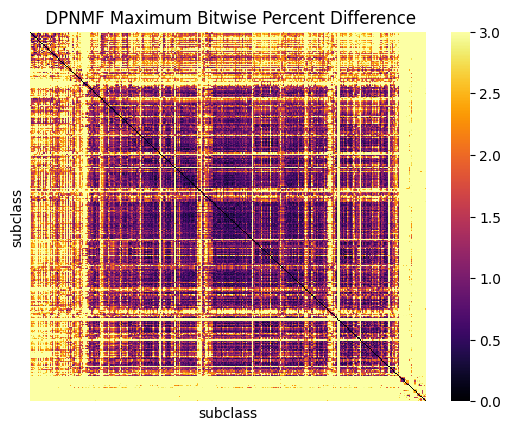

In [62]:
model = 'MLP'
noise = '1000.0'
files = {}
files['CIPHER'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1/Simulation/Reference/params_fig_Probe Number Tradeoff (18 Bits)_decoder_n_lyr_1_n_probes_50000_n_bit_18_replicate_1.h5ad"
files['DPNMF'] = f"/scratchdata1/GeneralStorage/Zach/Designs/Sync/TreeDPNMF_18bit/Simulation/Reference/TreeDPNMF_18bit.h5ad"
data = {}
dmat_results = {}
for dataset,file in files.items():
    print(dataset)
    adata = anndata.read_h5ad(file)
    adata.X = 6*adata.X*(adata.X.sum(1).mean()/adata.X.sum(1))[:,None]

    type_by_feature_avg = adata.to_df().groupby(adata.obs['subclass']).mean()

    P_clean = torch.tensor(type_by_feature_avg.values)
    median_val = P_clean.sum(1).clamp(min=1e-8).median()
    P_clean_sum_norm = median_val * P_clean / P_clean.sum(1).unsqueeze(1).clamp(min=1e-8)
    data[dataset] = P_clean_sum_norm.numpy()

    P = pd.DataFrame(P_clean_sum_norm.numpy(),index=type_by_feature_avg.index,columns=type_by_feature_avg.columns)
    
    distance_matrix = pd.DataFrame(np.zeros([P.shape[0],P.shape[0]]),index=P.index,columns=P.index)
    for i in tqdm(P.index):
        for j in P.index:
            if i==j:
                continue
            if distance_matrix.loc[i,j]!=0:
                continue
            d = np.max(np.abs(P.loc[i,:]-P.loc[j,:]) / P.loc[[i,j],:].min(0))
            distance_matrix.loc[i,j] = d
            distance_matrix.loc[j,i] = d
    dmat_results[dataset] = distance_matrix
    ax = sns.heatmap(distance_matrix,xticklabels=False,yticklabels=False,vmin=0,vmax = np.percentile(distance_matrix.values.flatten(),99),cmap='inferno')
    plt.title(f" {dataset} Maximum Bitwise Percent Difference")
    plt.savefig(f'{output_dir}/Simulation_distance_matrix_{dataset}.pdf',bbox_inches='tight',format='pdf')
    plt.show()

    ax = sns.heatmap(distance_matrix,xticklabels=False,yticklabels=False,vmin=0,vmax=3,cmap='inferno')
    plt.title(f" {dataset} Maximum Bitwise Percent Difference")
    plt.savefig(f'{output_dir}/Simulation_distance_matrix_{dataset}_vmax3.pdf',bbox_inches='tight',format='pdf')
    plt.show()


CIPHER 0.5235442519187927 0.2300461232662201
DPNMF 0.39592939615249634 0.15640942752361298


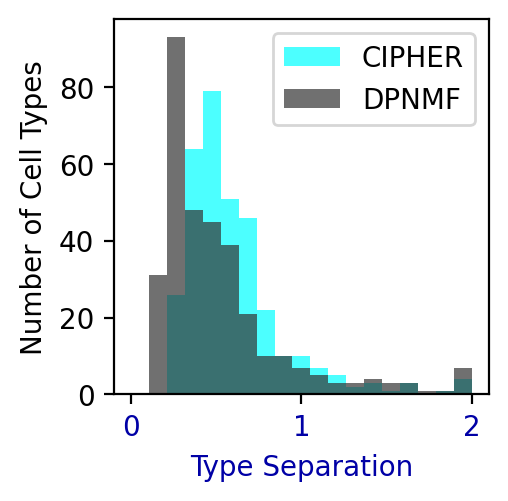

In [63]:
temp_results = {}
vmin = 0 
vmax = 2
bins = np.linspace(vmin,vmax,20)
# plt.figure(figsize=(6,4))
plt.figure(figsize=(2.5,2.5), dpi=200)
plt.axes([0.2, 0.2, 0.75, 0.75])
colors = {'DPNMF':figure_colors['DPNMF'],'CIPHER':figure_colors['CIPHER']}
for dataset,dmat in dmat_results.items():
    dmat[np.eye(dmat.shape[0],dtype=bool)] = np.nan
    temp_results[dataset] = np.nanmin(dmat,axis=0)
    plt.hist(np.clip(temp_results[dataset],vmin,vmax),bins=bins,alpha=0.7,label=dataset,color=colors[dataset])
    print(dataset,np.median(temp_results[dataset]),np.min(temp_results[dataset]))
plt.xlabel('Type Separation',color=figure_colors['Separation'])
plt.xticks(color=figure_colors['Separation'])
plt.ylabel('Number of Cell Types')
plt.legend()
# plt.title('Cell Type Separability Scores')
disable_clipping(plt.gca())
plt.savefig(f'{output_dir}/Cell_Type_Separability_Histogram.pdf',bbox_inches='tight',format='pdf')
plt.show()



/tmp/ipykernel_68438/2078859466.py:71: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


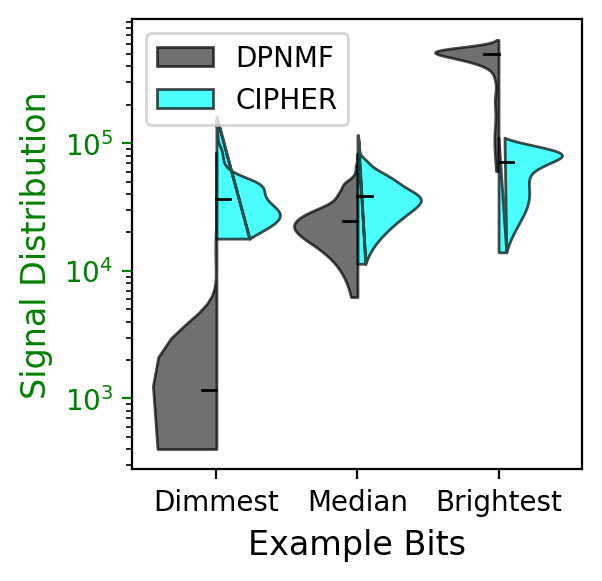

In [64]:
# --- 2. Determine the Sorting Order ---
cipher_medians = np.median(data['CIPHER'], axis=0)
sorted_cipher_indices = np.argsort(cipher_medians)
dpnmf_medians = np.median(data['DPNMF'], axis=0)
sorted_dpnmf_indices = np.argsort(dpnmf_medians)
# --- 3. Create the Plot ---
# fig, ax = plt.subplots(figsize=(4, 4))
fig = plt.figure(figsize=(3,3), dpi=200)
ax = plt.axes([0.2, 0.2, 0.75, 0.75])
# plt.figure(figsize=(10,4))
# Loop through the sorted indices and plot a split violin for each bit
for i, bit_index in enumerate(['Dimmest','Median','Brightest']):
    if bit_index == 'Dimmest':
        dpnmf_bit = dpnmf_medians == np.min(dpnmf_medians)
        cipher_bit = cipher_medians == np.min(cipher_medians)
    elif bit_index == 'Median':
        dpnmf_bit = np.argmin(np.abs(dpnmf_medians-np.median(dpnmf_medians)))
        cipher_bit = np.argmin(np.abs(cipher_medians-np.median(cipher_medians)))
    elif bit_index == 'Brightest':
        dpnmf_bit = dpnmf_medians == np.max(dpnmf_medians)
        cipher_bit = cipher_medians == np.max(cipher_medians)
    dpnmf_data_for_bit = data['DPNMF'][:, dpnmf_bit]
    cipher_data_for_bit = data['CIPHER'][:, cipher_bit]
    position = i

    # --- Plotting logic (previously in a function) is now directly here ---

    # --- Create violin for the left side (DPNMF) ---
    vp1 = ax.violinplot(dpnmf_data_for_bit, positions=[position], showmedians=False, showextrema=False, widths=0.9)
    body1 = vp1['bodies'][0]
    vertices1 = body1.get_paths()[0].vertices
    left_half_vertices = vertices1[vertices1[:, 0] <= position, :]
    left_half_vertices = np.concatenate([left_half_vertices, [[position, np.max(dpnmf_data_for_bit)], [position, np.min(dpnmf_data_for_bit)]]], axis=0)
    ax.add_collection(PolyCollection([left_half_vertices], facecolors=figure_colors['DPNMF'], edgecolors='black', alpha=0.7))
    ax.plot([position - 0.1, position], [np.median(dpnmf_data_for_bit)] * 2, color='black', linestyle='-', linewidth=1)

    # --- Create violin for the right side (CIPHER) ---
    vp2 = ax.violinplot(cipher_data_for_bit, positions=[position], showmedians=False, showextrema=False, widths=0.9)
    body2 = vp2['bodies'][0]
    vertices2 = body2.get_paths()[0].vertices
    right_half_vertices = vertices2[vertices2[:, 0] >= position, :]
    right_half_vertices = np.concatenate([right_half_vertices, [[position, np.max(cipher_data_for_bit)], [position, np.min(cipher_data_for_bit)]]], axis=0)
    ax.add_collection(PolyCollection([right_half_vertices], facecolors=figure_colors['CIPHER'], edgecolors='black', alpha=0.7))
    ax.plot([position, position + 0.1], [np.median(cipher_data_for_bit)] * 2, color='black', linestyle='-', linewidth=1)

    # Clean up the original, full violin plot bodies
    vp1['bodies'][0].remove()
    vp2['bodies'][0].remove()
    # --- End of plotting logic ---


# --- 4. Customize the Final Plot ---
ax.set_xticks(range(len(['Dimmest','Median','Brightest'])))
ax.set_xticklabels(['Dimmest','Median','Brightest'], ha="center")

ax.set_ylabel('Signal Distribution', fontsize=12,color=figure_colors['Dynamic'])
# ax.set_yticks(color=figure_colors['Dynamic'])
ax.set_xlabel('Example Bits', fontsize=12)

# ax.set_title('Dynamic Range & Brightness Usage', fontsize=16)
ax.set_yscale('log')
# color y ticks
ax.tick_params(axis='y', colors=figure_colors['Dynamic'])
legend_elements = [
    Patch(facecolor=figure_colors['DPNMF'], edgecolor='black', alpha=0.7, label='DPNMF'),
    Patch(facecolor=figure_colors['CIPHER'], edgecolor='black', alpha=0.7, label='CIPHER')
]
ax.legend(handles=legend_elements)

# ax.grid(axis='y', linestyle='--', alpha=0.6)
plt.tight_layout()
disable_clipping(plt.gca())
plt.savefig(f'{output_dir}/Dynamic_Range_Brightness_Usage.pdf',bbox_inches='tight',format='pdf')
plt.show()


/tmp/ipykernel_68438/900717671.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


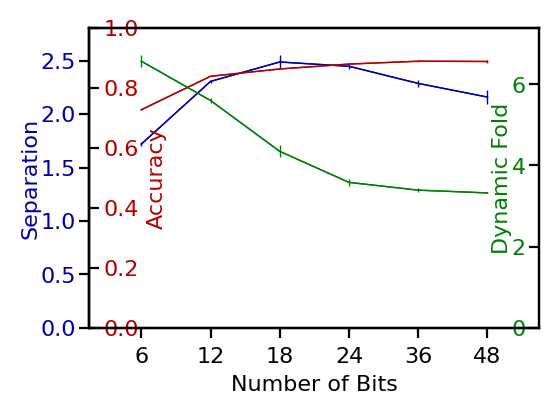

In [65]:
pattern = {}
pattern['decoder_n_lyr'] = '1'
pattern['fig'] = 'Dev Mouse Bit Number'#'Probe Number Tradeoff (18 Bits)'
matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
x_axis = ('n_bit','Number of Bits',['6','12','18','24','36','48'])#('n_probes','Number of Probes')
x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
mask = np.array([i in x_axis[2] for i in x_axis_values])
matching_runs = matching_runs[mask]
x_axis_values = x_axis_values[mask]
y_axis_parameters = ['Probes','Accuracy','Separation','Dynamic Fold']
color_mapper = {
    'Probes': figure_colors['Probes'],
    'Accuracy': figure_colors['Accuracy'],
    'Separation': figure_colors['Separation'],
    'Dynamic Fold': figure_colors['Dynamic Fold']}
x_axis_label_mapper = {
    'n_bit':'Number of Bits',
    'separation_wt':'Separation Weight',
    'brightness_s':'Brightness (Log10)',
    'n_probes': 'Number of Encoding Probes'}
y_axis_label_mapper = {
    'Probes': 'Number of Probes',
    'Accuracy': 'Accuracy',
    'Separation': 'Separation',
    'Dynamic Fold': 'Dynamic Fold'}

mu_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
std_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
for x_value in x_axis[2]:
    temp_mask = np.array(x_axis_values == x_value)
    temp_runs = matching_runs[temp_mask]
    for y_axis_parameter in y_axis_parameters:
        mu_df.loc[x_value,y_axis_parameter] = np.mean([results[run]['results'][y_axis_parameter] for run in temp_runs])
        std_df.loc[x_value,y_axis_parameter] = np.std([results[run]['results'][y_axis_parameter] for run in temp_runs])
labelfontsize=8
fig = plt.figure(figsize=(3,2), dpi=200)
axs = plt.axes([0.2, 0.2, 0.75, 0.75])
x_axis_values = mu_df.index
x_pos = np.arange(len(x_axis_values))
# plt.suptitle(f'Brightness Tradeoff')
main_ax = axs
for j,y_axis_parameter in enumerate(['Separation','Accuracy','Dynamic Fold']):
    if j == 0: # left y axis, left ticks, left labels
        ax = main_ax
        ax.yaxis.set_ticks_position('left')
        ax.yaxis.set_label_position('left')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=0, va='bottom', fontsize=labelfontsize)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_axis_values, fontsize=labelfontsize)
        ax.set_xlim(min(x_pos)-0.75,max(x_pos)+0.75)
        ax.set_xlabel(x_axis[1], labelpad=10, va='bottom', fontsize=labelfontsize)
    else:
        ax = main_ax.twinx()
    if j==1: # left y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['right'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom', fontsize=labelfontsize)
    elif j==2: # right y axis, left ticks, left labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], direction='in', pad=-10, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=-10, va='bottom', fontsize=labelfontsize)
    elif j==3: # right y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['left'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom', fontsize=labelfontsize)
    # if y_axis_parameter in ['Probes','Dynamic Range']:
    #     ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    #     ax.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
    if y_axis_parameter == 'Accuracy':
        ax.set_ylim(0,1)
    else:
        y_max = (mu_df[y_axis_parameter] + std_df[y_axis_parameter]).max() * 1.1
        y_min = 0
        ax.set_ylim(y_min,y_max)
    # bar_position = x_pos + j*total_bar_width/len(y_axis_parameters) - 0.4 + 0.8/len(y_axis_parameters)/2
    ax.plot(x_pos, mu_df[y_axis_parameter], color=color_mapper[y_axis_parameter],linewidth=0.5)
    # error bars
    ax.errorbar(x_pos, mu_df[y_axis_parameter], yerr=std_df[y_axis_parameter], color=color_mapper[y_axis_parameter],linewidth=0.5)

plt.tight_layout()
disable_clipping(plt.gca())
# set background to transparent
# fig.patch.set_facecolor('none')
# for char in [' ','(',')','=','+','-','*','/','^','%']:
#     figure = figure.replace(char,'_')
plt.savefig(f'{output_dir}/Dev_Mouse_Bit_Number.pdf',format='pdf')
plt.show()

/tmp/ipykernel_68438/2739030569.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


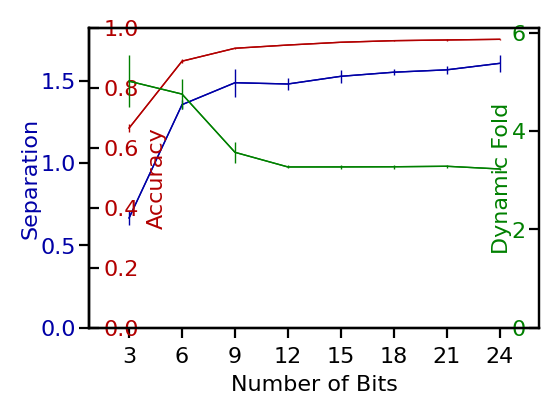

In [66]:
pattern = {}
pattern['decoder_n_lyr'] = '1'
pattern['fig'] = 'Lymph Bit Number'#'Probe Number Tradeoff (18 Bits)'
matching_runs = np.array([run for run,run_result in results.items() if filter_runs(run_result['parameters'],pattern)])
x_axis = ('n_bit','Number of Bits',['3','6','9','12','15','18','21','24'])#('n_probes','Number of Probes')
x_axis_values = np.array([results[run]['parameters'][x_axis[0]] for run in matching_runs])
mask = np.array([i in x_axis[2] for i in x_axis_values])
matching_runs = matching_runs[mask]
x_axis_values = x_axis_values[mask]
y_axis_parameters = ['Probes','Accuracy','Separation','Dynamic Fold']
color_mapper = {
    'Probes': figure_colors['Probes'],
    'Accuracy': figure_colors['Accuracy'],
    'Separation': figure_colors['Separation'],
    'Dynamic Fold': figure_colors['Dynamic Fold']}
x_axis_label_mapper = {
    'n_bit':'Number of Bits',
    'separation_wt':'Separation Weight',
    'brightness_s':'Brightness (Log10)',
    'n_probes': 'Number of Encoding Probes'}
y_axis_label_mapper = {
    'Probes': 'Number of Probes',
    'Accuracy': 'Accuracy',
    'Separation': 'Separation',
    'Dynamic Fold': 'Dynamic Fold'}

mu_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
std_df = pd.DataFrame(columns=y_axis_parameters,index=x_axis[2])
for x_value in x_axis[2]:
    temp_mask = np.array(x_axis_values == x_value)
    temp_runs = matching_runs[temp_mask]
    for y_axis_parameter in y_axis_parameters:
        mu_df.loc[x_value,y_axis_parameter] = np.mean([results[run]['results'][y_axis_parameter] for run in temp_runs])
        std_df.loc[x_value,y_axis_parameter] = np.std([results[run]['results'][y_axis_parameter] for run in temp_runs])
labelfontsize=8
fig = plt.figure(figsize=(3,2), dpi=200)
axs = plt.axes([0.2, 0.2, 0.75, 0.75])
x_axis_values = mu_df.index
x_pos = np.arange(len(x_axis_values))
# plt.suptitle(f'Brightness Tradeoff')
main_ax = axs
for j,y_axis_parameter in enumerate(['Separation','Accuracy','Dynamic Fold']):
    if j == 0: # left y axis, left ticks, left labels
        ax = main_ax
        ax.yaxis.set_ticks_position('left')
        ax.yaxis.set_label_position('left')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=0, va='bottom', fontsize=labelfontsize)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(x_axis_values, fontsize=labelfontsize)
        ax.set_xlim(min(x_pos)-0.75,max(x_pos)+0.75)
        ax.set_xlabel(x_axis[1], labelpad=10, va='bottom', fontsize=labelfontsize)
    else:
        ax = main_ax.twinx()
    if j==1: # left y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['right'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom', fontsize=labelfontsize)
    elif j==2: # right y axis, left ticks, left labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], direction='in', pad=-10, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=-10, va='bottom', fontsize=labelfontsize)
    elif j==3: # right y axis, right ticks, right labels
        ax.yaxis.set_ticks_position('right')
        ax.yaxis.set_label_position('right')
        ax.spines['left'].set_position(('axes', 0))
        ax.tick_params(axis='y', labelcolor=color_mapper[y_axis_parameter], pad=1.5, labelsize=labelfontsize)
        ax.set_ylabel(y_axis_label_mapper[y_axis_parameter],color=color_mapper[y_axis_parameter], labelpad=10, va='bottom', fontsize=labelfontsize)
    # if y_axis_parameter in ['Probes','Dynamic Range']:
    #     ax.yaxis.set_major_formatter(ScalarFormatter(useMathText=True))
    #     ax.ticklabel_format(style='scientific', axis='y', scilimits=(0,0))
    if y_axis_parameter == 'Accuracy':
        ax.set_ylim(0,1)
    else:
        y_max = (mu_df[y_axis_parameter] + std_df[y_axis_parameter]).max() * 1.1
        y_min = 0
        ax.set_ylim(y_min,y_max)
    # bar_position = x_pos + j*total_bar_width/len(y_axis_parameters) - 0.4 + 0.8/len(y_axis_parameters)/2
    ax.plot(x_pos, mu_df[y_axis_parameter], color=color_mapper[y_axis_parameter],linewidth=0.5)
    # error bars
    ax.errorbar(x_pos, mu_df[y_axis_parameter], yerr=std_df[y_axis_parameter], color=color_mapper[y_axis_parameter],linewidth=0.5)

plt.tight_layout()
disable_clipping(plt.gca())
# set background to transparent
# fig.patch.set_facecolor('none')
# for char in [' ','(',')','=','+','-','*','/','^','%']:
#     figure = figure.replace(char,'_')
plt.savefig(f'{output_dir}/Lymph_Bit_Number.pdf',format='pdf')
plt.show()

# Active

In [67]:
design_dir = "/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Lymph Bit Number_decoder_n_lyr_1_n_bit_9_n_probes_50000_replicate_1"
!ls "{design_dir}"
!ls "{design_dir}/results"

 categorical_converter.csv
 constraints.csv
'log_params_fig_Lymph Bit Number_decoder_n_lyr_1_n_bit_9_n_probes_50000_replicate_1.log'
 results
 used_user_parameters.csv
 X_test.pt
 X_train.pt
 X_Type_test.csv
 X_Type_test.pt
 y_test.pt
 y_train.pt
 comprehensive_performance.pdf
 confusion_matrix_test.pdf
 constraints_vs_probes_per_gene.pdf
 D_0.pdf
 D_4.pdf
 E_constrained.csv
 E_constrained.pt
 E.pdf
'learning_curve_$$$ - bit_usage_loss.pdf'
'learning_curve_$$$ - brightness_loss.pdf'
'learning_curve_$$$ - categorical_loss.pdf'
'learning_curve_$$$ - correlation_loss.pdf'
'learning_curve_$$$ - dynamic_loss.pdf'
'learning_curve_$$$ - gene_constraint_loss.pdf'
'learning_curve_$$$ - gene_importance_loss.pdf'
'learning_curve_$$$ - probe_wt_loss.pdf'
'learning_curve_$$$ - separation_loss.pdf'
'learning_curve_$$$ - sparsity_loss.pdf'
'learning_curve_$$$ - step_size_loss.pdf'
'learning_curve_$$$ - total_loss.pdf'
 learning_curve_accuracy.pdf
 learning_curve_avg_over_constraint.pdf
 learning_curv

In [68]:
X = torch.load(f"{design_dir}/X_train.pt")
Y = torch.load(f"{design_dir}/y_train.pt")
E = pd.read_csv(f"{design_dir}/results/E_constrained.csv",index_col=0)
E = torch.tensor(np.array(E.values).astype(float),dtype=X.dtype)
P = X.mm(E)
del X,E

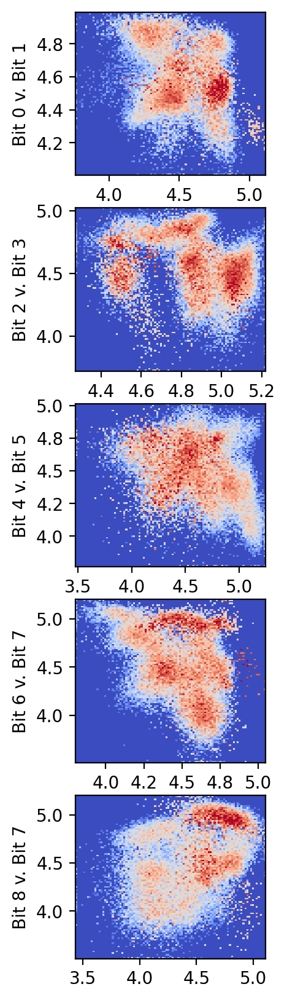

In [69]:
from typing import Optional, Dict, Any, List, Union
import logging
import math

def generate_intuitive_ticks(min_val: float, max_val: float, num_ticks: int = 5) -> np.ndarray:
    """
    Generate intuitive tick values that are easy to read.
    
    Creates tick values using "nice" numbers (1, 2, 2.5, 5 times powers of 10)
    that are close to the desired number of ticks and easy for humans to read.
    
    Args:
        min_val (float): Minimum value for the axis
        max_val (float): Maximum value for the axis
        num_ticks (int): Desired number of ticks. Default: 5
        
    Returns:
        np.ndarray: Array of tick values between min_val and max_val
        
    Note:
        - Uses powers of 10 multiplied by 1, 2, 2.5, or 5
        - Selects step size closest to desired number of ticks
        - Handles edge case where min_val == max_val
    """
    if min_val == max_val:return np.array([min_val])
    range_val = max_val - min_val
    initial_step = range_val/num_ticks
    potential_good_values = [1*10**i for i in np.arange(-10,10).astype(float)]
    potential_good_values.extend([2*10**i for i in np.arange(-10,10).astype(float)])
    potential_good_values.extend([2.5*10**i for i in np.arange(-10,10).astype(float)])
    potential_good_values.extend([5*10**i for i in np.arange(-10,10).astype(float)])
    potential_good_values = np.sort(np.unique(potential_good_values))
    potential_step1 = potential_good_values[potential_good_values<initial_step][-1]
    start_val = math.ceil(min_val/potential_step1) * potential_step1
    potential_ticks1 = np.arange(start_val, max_val, potential_step1)
    potential_step2 = potential_good_values[potential_good_values>initial_step][0]
    start_val = math.ceil(min_val/potential_step2) * potential_step2
    potential_ticks2 = np.arange(start_val, max_val, potential_step2)
    # pick the one with the number of ticks closest to num_ticks
    if (potential_ticks1.shape[0] - num_ticks) < (potential_ticks2.shape[0] - num_ticks):
        ticks = potential_ticks1
        step = potential_step1
    else:
        ticks = potential_ticks2
        step = potential_step2
    return ticks

def plot_projection_space_density(P: np.ndarray, y_labels: np.ndarray, plot_path: str, sum_norm: bool = False, log: Optional[logging.Logger] = None, use_log10_scale: bool = False) -> None:
    """
    Plot 2D density plots of projection space for all bit pairs.
    
    Creates a grid of 2D density plots showing the distribution of samples in
    projection space. Each plot shows a pair of bits, with both overall density
    and cell-type-specific density overlays.
    
    Args:
        P (np.ndarray): Projection matrix of shape (n_samples, n_bits)
        y_labels (np.ndarray): Cell type labels of shape (n_samples,)
        plot_path (str): Path to save the plot (PDF format)
        sum_norm (bool): Whether to apply sum normalization. Default: False
        log (Optional[logging.Logger]): Logger instance. If None, creates default logger.
        use_log10_scale (bool): Whether to use log10 scale for axes. Default: False
            
    Note:
        - Creates plots for all bit pairs (arranged in 2 columns)
        - Left column: Overall density heatmap
        - Right column: Cell-type-specific colored overlays
        - Uses 2D histograms with 100 bins per axis
        - Applies percentile-based clipping to handle outliers
        - Saves as PDF with 300 DPI
    """
    if log is None:
        log = logging.getLogger("ProjectionPlotDensity")
    log.info(f"Generating projection space density plot: {plot_path}")
    if sum_norm:
        P = P * (np.clip(P.sum(1),1,None).mean() / (np.clip(P.sum(1),1,None)[:, None]))
    labels = np.array([f"Bit {str(bit)}" for bit in range(P.shape[1])])
    unique_cell_types = np.unique(y_labels)
    num_measurements = labels.shape[0]
    num_plot_pairs = math.ceil(num_measurements / 2)
    total_rows = num_plot_pairs
    total_cols = 1
    fig, axes = plt.subplots(total_rows, total_cols,figsize=(2*total_cols, 2 * total_rows), squeeze=False, dpi=200) 
    color_mapper = {}
    used_colors_list = [np.array([0., 0., 0.]), np.array([1., 1., 1.])]
    plot_pair_idx = 0 
    for i_pair_start in range(num_measurements):
        if i_pair_start % 2 == 0 and plot_pair_idx < num_plot_pairs: 
            feature_idx1 = i_pair_start
            if feature_idx1 + 1 >= num_measurements:
                feature_idx2 = feature_idx1 - 1 
                if feature_idx2 < 0: continue 
            else:
                feature_idx2 = feature_idx1 + 1
            feature_name1 = labels[feature_idx1]
            feature_name2 = labels[feature_idx2]
            x = np.array(P[:, feature_idx1]).ravel()
            y = np.array(P[:, feature_idx2]).ravel()
            
            # Only filter positive values if using log10 scale
            if use_log10_scale:
                x_pos = x[x > 0]
                y_pos = y[y > 0]
                if len(x_pos) > 1: vmin_x, vmax_x = np.percentile(x_pos, [0.1, 99.9])
                elif len(x_pos) == 1: vmin_x, vmax_x = x_pos[0], x_pos[0]
                else: vmin_x, vmax_x = 0, 0
                if len(y_pos) > 1: vmin_y, vmax_y = np.percentile(y_pos, [0.1, 99.9])
                elif len(y_pos) == 1: vmin_y, vmax_y = y_pos[0], y_pos[0]
                else: vmin_y, vmax_y = 0, 0
            else:
                # Use all values including negatives for linear scale
                if len(x) > 1: vmin_x, vmax_x = np.percentile(x, [0.1, 99.9])
                elif len(x) == 1: vmin_x, vmax_x = x[0], x[0]
                else: vmin_x, vmax_x = 0, 0
                if len(y) > 1: vmin_y, vmax_y = np.percentile(y, [0.1, 99.9])
                elif len(y) == 1: vmin_y, vmax_y = y[0], y[0]
                else: vmin_y, vmax_y = 0, 0
            
            vmax_x = max(vmax_x, vmin_x)
            vmax_y = max(vmax_y, vmin_y)
            x = np.clip(x, vmin_x, vmax_x)
            if use_log10_scale: x = np.log10(x + 1) 
            x_min, x_max = x.min(), x.max()
            x_bins = np.linspace(x_min, x_max if x_max > x_min else x_max + 1, 100)
            y = np.clip(y, vmin_y, vmax_y)
            if use_log10_scale: y = np.log10(y + 1) 
            y_min, y_max = y.min(), y.max()
            y_bins = np.linspace(y_min, y_max if y_max > y_min else y_max + 1, 100)
            current_row_idx = plot_pair_idx
            # ax1 = axes[current_row_idx, 0] 
            ax1 = axes[current_row_idx,0] 
            img, _, _ = np.histogram2d(x, y, bins=[x_bins, y_bins])
            img = np.log10(img + 1) 
            img_pos = img[img > 0]
            if len(img_pos) > 0:
                vmin_img, vmax_img = np.percentile(img_pos, [0.1, 99]) 
                if vmin_img == vmax_img: vmax_img += 1e-6 
            else: vmin_img, vmax_img = 0, 1 
            im1 = ax1.imshow(img.T, vmin=vmin_img, vmax=vmax_img, cmap='coolwarm', origin='lower', aspect='auto', interpolation='nearest',
                           extent=[x_bins[0], x_bins[-1], y_bins[0], y_bins[-1]], rasterized=True)
            
            # Generate intuitive tick values
            x_tick_values = generate_intuitive_ticks(x_bins[0], x_bins[-1], num_ticks=5)
            y_tick_values = generate_intuitive_ticks(y_bins[0], y_bins[-1], num_ticks=5)
            
            ax1.set_xticks(x_tick_values)
            ax1.set_yticks(y_tick_values)
            ax1.set_xticklabels([f"{val:.1f}" for val in x_tick_values])
            ax1.set_yticklabels([f"{val:.1f}" for val in y_tick_values])
            ax1.set_ylabel(f"{feature_name1} v. {feature_name2}")
            # if use_log10_scale:
            #     ax1.set_xlabel(f"{feature_name1} Log10")
            #     ax1.set_ylabel(f"{feature_name2} Log10")
            # else:
            #     ax1.set_xlabel(f"{feature_name1}")
            #     ax1.set_ylabel(f"{feature_name2}")
            ax1.grid(False)
            plot_pair_idx += 1 
    try:
        plt.savefig(plot_path.replace('.png', '.pdf'), dpi=300, bbox_inches='tight',format='pdf')
        log.info(f"Saved projection space density plot to {plot_path.replace('.png', '.pdf')}")
    except Exception as e:
        log.error(f"Failed to save plot {plot_path.replace('.png', '.pdf')}: {e}")
    finally:
        plt.show()
        # plt.close(fig)
plot_path= f"{output_dir}/Lymph_Bit_Number_projection_space_density.pdf"
plot_projection_space_density(P = P.numpy(), y_labels=Y.numpy(), plot_path=plot_path, sum_norm=True, log = None, use_log10_scale=True)

In [70]:
design_dir = "/scratchdata1/GeneralStorage/Zach/Designs/Sync/params_fig_Dev Mouse Bit Number_decoder_n_lyr_1_n_bit_24_n_probes_50000_replicate_1"
!ls "{design_dir}"
!ls "{design_dir}/results"

 categorical_converter.csv
 constraints.csv
'log_params_fig_Dev Mouse Bit Number_decoder_n_lyr_1_n_bit_24_n_probes_50000_replicate_1.log'
 results
 used_user_parameters.csv
 X_test.pt
 X_train.pt
 X_Type_test.csv
 X_Type_test.pt
 y_test.pt
 y_train.pt
 comprehensive_performance.pdf
 confusion_matrix_test.pdf
 constraints_vs_probes_per_gene.pdf
 D_0.pdf
 D_4.pdf
 E_constrained.csv
 E_constrained.pt
 E.pdf
'learning_curve_$$$ - bit_usage_loss.pdf'
'learning_curve_$$$ - brightness_loss.pdf'
'learning_curve_$$$ - categorical_loss.pdf'
'learning_curve_$$$ - correlation_loss.pdf'
'learning_curve_$$$ - dynamic_loss.pdf'
'learning_curve_$$$ - gene_constraint_loss.pdf'
'learning_curve_$$$ - gene_importance_loss.pdf'
'learning_curve_$$$ - probe_wt_loss.pdf'
'learning_curve_$$$ - separation_loss.pdf'
'learning_curve_$$$ - sparsity_loss.pdf'
'learning_curve_$$$ - step_size_loss.pdf'
'learning_curve_$$$ - total_loss.pdf'
 learning_curve_accuracy.pdf
 learning_curve_avg_over_constraint.pdf
 learning

In [71]:
cell_metadata = pd.read_csv('/scratchdata1/ExternalData/Dev_Mouse/Training_data/cell_metadata.csv',index_col=0)
cell_metadata

,donor_id,development_stage_ontology_term_id,sex_ontology_term_id,self_reported_ethnicity_ontology_term_id,disease_ontology_term_id,tissue_ontology_term_id,cell_type_ontology_term_id,assay_ontology_term_id,suspension_type,author_experimental_id,...,cell_type,assay,disease,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid,library_size,scaling_factor
run_17_PC-03B_S210.TAGAGAGTATGACGACCTGC-6,embryo_29,MmusDv:0000022,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_17,...,neural cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 15,8NnV{BB1WP,1546.0,64.683053
run_25_PC-05H_S232.AGAGATGAATTTACTTGGAA-14,embryo_74,MmusDv:0000036,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_25,...,neural cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 27,apEooN2TsW,1115.0,89.686099
run_15_PB-03D_S116.ATTGAGGAATCCGATTCCTG-3,embryo_15,MmusDv:0000021,PATO:0000384,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_15,...,neural cell,sci-RNA-seq3,normal,male,embryo,na,Theiler stage 14,qxjyznOR)5,6023.0,16.603022
run_14_PX-12B_S186.TTATCCGCTGTATAATACG-2,embryo_41,MmusDv:0000027,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_14,...,neural cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 20,+QXuet6hT#,3635.0,27.510316
run_17_PD-01C_S291.ATATCCTACTTATGAGTTAA-5,embryo_27,MmusDv:0000022,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0002319,EFO:0030028,nucleus,run_17,...,neural cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 15,MaustzY&zA,3149.0,31.756113
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
run_25_PC-08B_S250.CTGAGCATTTATCGTCGGC-14,embryo_74,MmusDv:0000036,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0000604,EFO:0030028,nucleus,run_25,...,retinal rod cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 27,0-#iFqxA=^,704.0,142.045455
run_25_PA-10A_S73.TGAGAATCATGTATAATACG-14,embryo_74,MmusDv:0000036,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0000604,EFO:0030028,nucleus,run_25,...,retinal rod cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 27,3DuZ0IoOAV,1420.0,70.422535
run_27_PG-07A_S241.AGCATAACTTAAGTCTTCCG-16,embryo_71,MmusDv:0000035,PATO:0000384,na,PATO:0000461,UBERON:0000922,CL:0000604,EFO:0030028,nucleus,run_27,...,retinal rod cell,sci-RNA-seq3,normal,male,embryo,na,Theiler stage 26,qE((P729N&,1142.0,87.565674
run_25_PA-09A_S65.CAGCATTGTACCGCCAACC-14,embryo_74,MmusDv:0000036,PATO:0000383,na,PATO:0000461,UBERON:0000922,CL:0000604,EFO:0030028,nucleus,run_25,...,retinal rod cell,sci-RNA-seq3,normal,female,embryo,na,Theiler stage 27,H%%OS5j)?3,840.0,119.047619


In [72]:
sup_tables_path = '/scratchdata1/ExternalData/Dev_Mouse/Training_data/41586_2024_7069_MOESM4_ESM.xlsx'
desired_sheet = "Table.22"
table = pd.read_excel(sup_tables_path,sheet_name=desired_sheet,index_col=0,skiprows=2)
table.head(50)

,Node ID (x),Node ID (y),Cell state name (x),Cell state name (y),Edge type,Unnamed: 6
Subsystem,,,,,,
Pre_gastrulation,PGa_M1,PGa_M2,Oocyte,1-cell,Developmental progression,NaN
Pre_gastrulation,PGa_M2,PGa_M3,1-cell,2-cell,Developmental progression,NaN
Pre_gastrulation,PGa_M3,PGa_M4,2-cell,4-cell,Developmental progression,NaN
Pre_gastrulation,PGa_M4,PGa_M5,4-cell,8-cell,Developmental progression,NaN
Pre_gastrulation,PGa_M5,PGa_M6,8-cell,Morula,Developmental progression,NaN
Pre_gastrulation,PGa_M6,PGa_M7,Morula,Inner cell mass,Developmental progression,NaN
Pre_gastrulation,PGa_M6,PGa_M8,Morula,Trophectoderm,Developmental progression,NaN
Pre_gastrulation,PGa_M8,PGa_M9,Trophectoderm,Extraembryonic ectoderm,Developmental progression,NaN
Pre_gastrulation,PGa_M7,PGa_M10,Inner cell mass,Hypoblast,Developmental progression,NaN


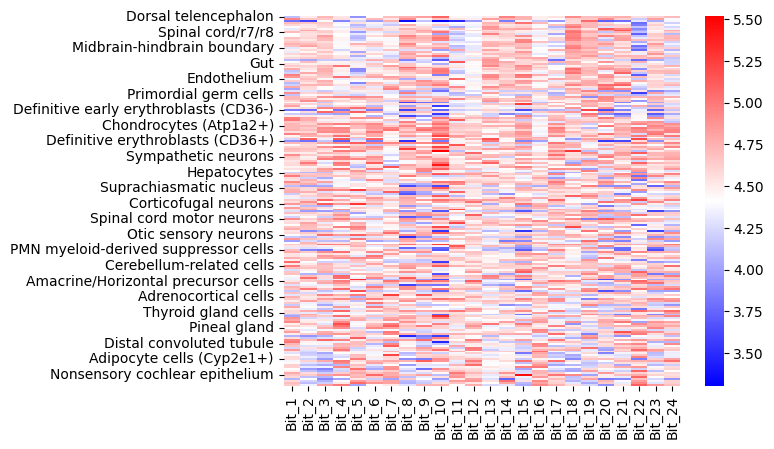

In [73]:
P_Type = pd.read_csv(f"{design_dir}/results/P_Type.csv",index_col=0) # Log10
import seaborn as sns
sns.heatmap(P_Type,cmap='bwr')
plt.show()
# P_Type

Color Mapping Order: ['Pre_gastrulation', 'Pre_gastrulation_Gastrulation', 'Gastrulation', 'Gastrulation_E8.5b', 'Notochord', 'Blood', 'Eye', 'Renal', 'Gut', 'PNS_glia', 'PNS_neurons', 'Lateral_plate_mesoderm', 'Endothelium', 'Mesoderm', 'Epithelial_cells', 'Brain_spinal_cord']
Step 1: Imputing vectors for all nodes...
Step 2: Clustering all nodes...
Step 3: Assigning Y-coordinates (Hiding empty rows)...


/tmp/ipykernel_68438/507475426.py:305: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


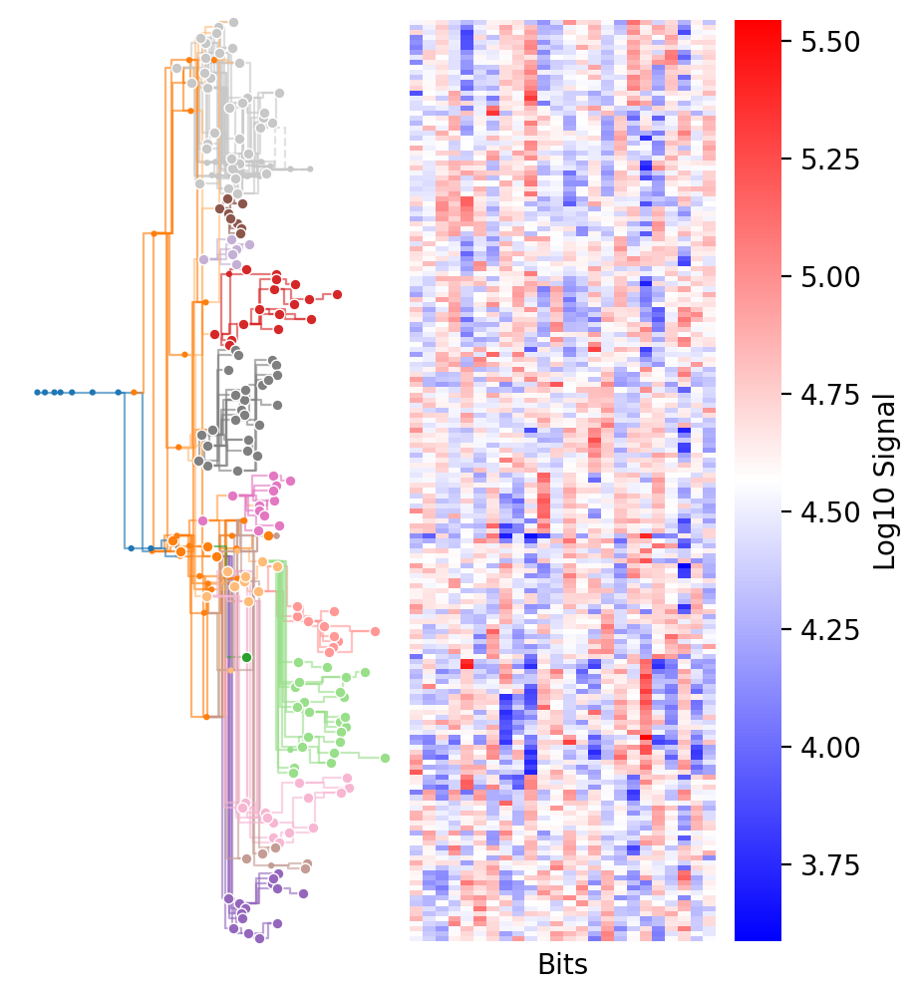

/tmp/ipykernel_68438/507475426.py:320: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


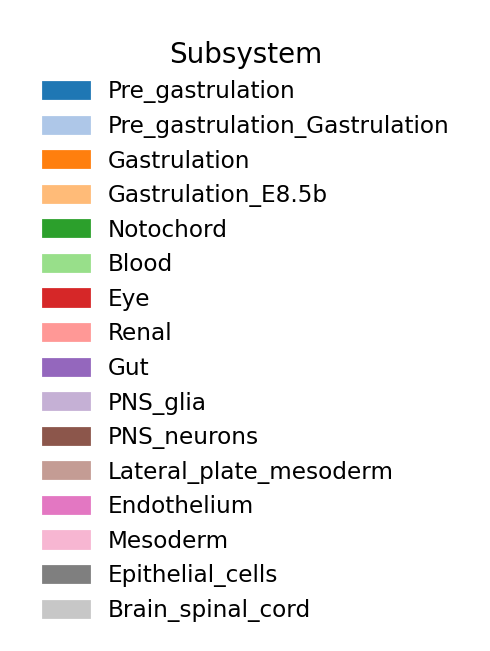

Plot saved to /home/zach/PythonRepos/Design/Design/Results/Figures/Dev_Mouse_P_Type_Heatmap.pdf


In [74]:
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
from scipy.cluster.hierarchy import linkage, leaves_list

def reorder_within_subsystems(table22, subsystem_order):
    reordered_rows = []
    existing_subs = set(table22['Subsystem'].dropna().unique())
    manual_set = set(subsystem_order)
    missing = list(existing_subs - manual_set)
    full_order = subsystem_order + missing
    
    for sub in full_order:
        sub_df = table22[table22['Subsystem'] == sub].copy()
        if sub_df.empty: continue

        G_sub = nx.DiGraph()
        for idx, row in sub_df.iterrows():
            u = row['Cell state name (x)']
            v = row['Cell state name (y)']
            if pd.notna(u) and pd.notna(v):
                if G_sub.has_edge(u, v):
                    G_sub[u][v]['rows'].append(idx)
                else:
                    G_sub.add_edge(u, v, rows=[idx])
        
        try:
            nodes_ordered = list(nx.topological_sort(G_sub))
        except nx.NetworkXUnfeasible:
            nodes_ordered = sorted(G_sub.nodes(), key=lambda n: G_sub.in_degree(n))
        
        for u in nodes_ordered:
            for v in G_sub.successors(u):
                idxs = G_sub[u][v]['rows']
                for idx in idxs:
                    reordered_rows.append(table22.loc[idx])
                    
    return pd.DataFrame(reordered_rows)

def create_manual_tree_fixed_color_heatmap(table22_path, ptype_path, output_file='manual_tree_fixed_color_heatmap.png'):
    # 1. Load Data
    table22 = pd.read_excel(table22_path, sheet_name='Table.22', skiprows=2)
    p_type = pd.read_csv(ptype_path, index_col=0)

    # Normalize P_type
    p_type = 10**p_type - 1
    scaling_factor = p_type.sum(axis=1).mean() / p_type.sum(axis=1)
    p_type = p_type.mul(scaling_factor, axis=0)
    p_type = np.log10(p_type + 1)

    # 2. Define Colors & Layout
    initial_subs_order = []
    seen = set()
    for sub in table22['Subsystem']:
        if pd.notna(sub) and sub not in seen:
            initial_subs_order.append(sub)
            seen.add(sub)
            
    palette = sns.color_palette("tab20", len(initial_subs_order))
    subsystem_color_map = dict(zip(initial_subs_order, palette))
    print("Color Mapping Order:", initial_subs_order)

    manual_layout_order = [
        'Brain_spinal_cord',
        'PNS_neurons',
        'PNS_glia',
        'Eye',
        'Epithelial_cells',
        'Endothelium',
        'Gastrulation',
        'Pre_gastrulation',
        'Pre_gastrulation_Gastrulation',
        'Gastrulation_E8.5b',
        'Renal',
        'Notochord',
        'Blood',
        'Mesoderm',
        'Lateral_plate_mesoderm',
        'Gut',
    ]

    # 3. Build Graph
    table22_ordered = reorder_within_subsystems(table22, manual_layout_order)
    G = nx.DiGraph()
    node_subsystem_map = {}
    
    edges_df = table22_ordered[['Subsystem', 'Cell state name (x)', 'Cell state name (y)']].dropna()
    for _, row in edges_df.iterrows():
        sub = row['Subsystem']
        u = row['Cell state name (x)']
        v = row['Cell state name (y)']
        G.add_edge(u, v, subsystem=sub)
        if u not in node_subsystem_map: node_subsystem_map[u] = sub
        if v not in node_subsystem_map: node_subsystem_map[v] = sub

    # Identify nodes that have REAL data
    graph_nodes = set(G.nodes())
    p_type_filtered = p_type[p_type.index.isin(graph_nodes)].dropna(how='all')
    valid_data_nodes = set(p_type_filtered.index)

    # 4. Connect Orphans
    roots = [n for n in G.nodes() if G.in_degree(n) == 0]
    main_root = None
    for r in roots:
        if 'Pre_gastrulation' in node_subsystem_map.get(r, '') or 'Oocyte' in r:
            main_root = r
            break
    if not main_root and roots: main_root = roots[0]
    
    main_component = set(nx.descendants(G, main_root))
    main_component.add(main_root)
    orphans = [n for n in G.nodes() if n not in main_component and G.in_degree(n)==0]
    
    # Calculate initial depths for sorting orphans
    try:
        subG = G.subgraph(main_component)
        base_depths = {}
        for node in nx.topological_sort(subG):
            preds = list(subG.predecessors(node))
            base_depths[node] = (max(base_depths[p] for p in preds) + 1) if preds else 0
    except:
        base_depths = nx.single_source_shortest_path_length(G, main_root)
        
    for orphan in orphans:
        sub = node_subsystem_map.get(orphan)
        candidates = [n for n in main_component if node_subsystem_map.get(n) == sub]
        if candidates:
            candidates.sort(key=lambda x: base_depths.get(x, -1), reverse=True)
            best_parent = candidates[0]
            G.add_edge(best_parent, orphan, subsystem=sub, type='inferred')
        else:
            G.add_edge(main_root, orphan, subsystem='Inferred', type='inferred')

    # 5. Calculate Final X-Depths
    try:
        depth_map = {}
        for node in nx.topological_sort(G):
            preds = list(G.predecessors(node))
            depth_map[node] = (max(depth_map[p] for p in preds) + 1) if preds else 0
    except:
        depth_map = nx.single_source_shortest_path_length(G, main_root)
    
    def jitter(): return np.random.uniform(0,0.75)
    depth_map = {k:(v+jitter())**1.7 for k,v in depth_map.items()}

    # --- STEP 1: VECTOR IMPUTATION (Estimating P_type for ALL nodes) ---
    print("Step 1: Imputing vectors for all nodes...")
    vector_map = {idx: row.values for idx, row in p_type_filtered.iterrows()}
    
    try:
        rev_topo_order = list(nx.topological_sort(G))[::-1]
    except:
        rev_topo_order = list(G.nodes())

    max_passes = 10
    for i in range(max_passes):
        updates = 0
        for node in rev_topo_order:
            if node in vector_map: continue 
            
            children = list(G.successors(node))
            child_vecs = [vector_map[c] for c in children if c in vector_map]
            
            if child_vecs:
                vector_map[node] = np.mean(child_vecs, axis=0)
                updates += 1
        if updates == 0: break
        
    p_type_augmented = pd.DataFrame.from_dict(vector_map, orient='index')
    if not p_type_augmented.empty:
        p_type_augmented.columns = p_type_filtered.columns

    # --- STEP 2: CLUSTERING (Get Full Sort Order) ---
    print("Step 2: Clustering all nodes...")
    full_sorted_list = []
    
    existing_subs = set(node_subsystem_map.values())
    manual_set = set(manual_layout_order)
    missing = list(existing_subs - manual_set)
    full_sub_order = manual_layout_order + missing

    for sub in full_sub_order:
        sub_nodes = [n for n in G.nodes() if node_subsystem_map.get(n) == sub]
        valid_sub_nodes = [n for n in sub_nodes if n in p_type_augmented.index]
        
        if not valid_sub_nodes: continue
            
        if len(valid_sub_nodes) > 1:
            data_matrix = p_type_augmented.loc[valid_sub_nodes]
            Z = linkage(data_matrix, method='ward', metric='euclidean')
            leaves_idx = leaves_list(Z)
            sorted_nodes = [valid_sub_nodes[i] for i in leaves_idx]
            full_sorted_list.extend(sorted_nodes)
        else:
            full_sorted_list.extend(valid_sub_nodes)

    # --- STEP 3: ASSIGN Y-COORDINATES (The Logic Fix) ---
    print("Step 3: Assigning Y-coordinates (Hiding empty rows)...")
    y_map = {}
    
    # 3a. Assign integer rows ONLY to real data nodes
    # We iterate through the CLUSTERED list, but only increment Y if it's a data node.
    heatmap_ordered_nodes = [] # This will be the exact order for the heatmap
    current_y = 0
    
    for node in full_sorted_list:
        if node in valid_data_nodes:
            y_map[node] = current_y + 0.5
            heatmap_ordered_nodes.append(node)
            current_y += 1
        else:
            # It's an internal node. 
            # Do NOT assign a Y yet. 
            # Do NOT increment current_y.
            pass

    # 3b. Backfill internal nodes (Average of children)
    # We use the existing multi-pass logic to place them visually between rows
    for i in range(max_passes):
        updates = 0
        for node in rev_topo_order:
            if node in y_map: continue # Already placed
            
            children = list(G.successors(node))
            child_ys = [y_map[c] for c in children if c in y_map]
            
            if child_ys:
                y_map[node] = sum(child_ys) / len(child_ys)
                updates += 1
        if updates == 0: break
        
    # 3c. Final Root Check
    if main_root and main_root not in y_map:
         current_vals = list(y_map.values())
         if current_vals:
             y_map[main_root] = sum(current_vals) / len(current_vals)
         else:
             y_map[main_root] = 0

    # 3d. Pruning (Remove nodes that still have no Y)
    # These are dead branches that never connected to real data
    nodes_to_plot = set(y_map.keys())
    depth_map = {k: v for k, v in depth_map.items() if k in nodes_to_plot}

    # 6. Plotting
    fig, axes = plt.subplots(1, 2, figsize=(5, 6), gridspec_kw={'width_ratios': [1, 1], 'wspace': 0.02}, sharey=True, dpi=200)
    ax_graph, ax_heat = axes

    # Calculate Visual Limits
    if depth_map:
        max_depth = max(depth_map.values())
        ax_graph.set_xlim(-max_depth * 0.05, max_depth * 1.05)
    
    if y_map:
        # Pad the Y-limits to show top/bottom rows clearly
        min_y, max_y = min(y_map.values()), max(y_map.values())
        ax_graph.set_ylim(max_y + 1, min_y - 1) 

    # Plot Edges
    for u, v, data in G.edges(data=True):
        if u in y_map and v in y_map:
            x1, y1 = depth_map[u], y_map[u]
            x2, y2 = depth_map[v], y_map[v]
            sub = data.get('subsystem')
            edge_type = data.get('type', 'normal')
            
            color = subsystem_color_map.get(sub, 'gray')
            style = '--' if edge_type == 'inferred' else '-'
            alpha = 0.5 if edge_type == 'inferred' else 0.6
            
            ax_graph.plot([x1, x2], [y1, y2], color=color, linestyle=style, 
                          alpha=alpha, linewidth=0.8, drawstyle='steps-mid', clip_on=False)

    # Plot Nodes
    ptype_nodes_set = set(p_type_filtered.index)
    for node in G.nodes():
        if node in y_map:
            x, y = depth_map[node], y_map[node]
            sub = node_subsystem_map.get(node)
            color = subsystem_color_map.get(sub, 'black')
            is_in_ptype = node in ptype_nodes_set
            
            size = 15 if is_in_ptype else 5
            edgecolor = 'white' if is_in_ptype else 'none'
            
            if size > 0:
                ax_graph.scatter(x, y, c=[color], s=size, zorder=3, 
                                 edgecolors=edgecolor, linewidth=0.5, clip_on=False)

    ax_graph.invert_yaxis()
    ax_graph.axis('off')

    # Prepare Heatmap Data (Order matches the compacted valid nodes)
    p_type_vis = p_type_filtered.reindex(heatmap_ordered_nodes)
    
    # Heatmap
    sns.heatmap(p_type_vis, ax=ax_heat, cmap='bwr', cbar_kws={'label': 'Log10 Signal'},xticklabels=False,yticklabels=False)
    ax_heat.set_ylabel("")
    ax_heat.set_xlabel("Bits")
    # ax_heat.tick_params(axis='y', labelsize=4)

    plt.tight_layout()
    plt.savefig(output_file, dpi=200,format='pdf')
    plt.show()
    
    # Save Legend
    legend_handles = []
    for sub in initial_subs_order:
        color = subsystem_color_map.get(sub, 'black')
        legend_handles.append(mpatches.Patch(color=color, label=sub))
        
    # fig, ax = plt.subplots(figsize=[5,5])
    fig = plt.figure(figsize=(3,3), dpi=200)
    ax = plt.axes([0.2, 0.2, 0.75, 0.75])
    ax.axis('off')
    ax.legend(handles=legend_handles, fontsize='small', title="Subsystem", frameon=False)
    plt.tight_layout()
    plt.savefig(output_file.replace('Heatmap.pdf','Legend.pdf'), dpi=200,format='pdf')
    plt.show()
    print(f"Plot saved to {output_file}")

create_manual_tree_fixed_color_heatmap(
    '/scratchdata1/ExternalData/Dev_Mouse/Training_data/41586_2024_7069_MOESM4_ESM.xlsx', 
    f"{design_dir}/results/P_Type.csv",
    output_file = f"{output_dir}/Dev_Mouse_P_Type_Heatmap.pdf"
)

# Experimental Data

In [75]:
fname = f"/scratchdata1/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/anndata/WellB-Section1_MLP_full_decoded_anndata_imputed.h5ad"
measured_imputed_adata = anndata.read_h5ad(fname)
measured_imputed_adata = measured_imputed_adata[measured_imputed_adata.obs['ccf_z']<6]
# dataset2 = anndata.read_h5ad('')
measured_imputed_adata

View of AnnData object with n_obs × n_vars = 56100 × 32285
    obs: 'label', 'stage_x', 'stage_y', 'image_x', 'image_y', 'image_idx', 'size', 'section_index', 'dapi', 'sum', 'dataset', 'well', 'ccf_x', 'ccf_y', 'ccf_z', 'in_large_comp', 'neuron', 'neuron_color', 'subclass', 'subclass_color', 'reference_neighbor_0', 'reference_neighbor_1', 'reference_neighbor_2', 'reference_neighbor_3', 'reference_neighbor_4', 'reference_neighbor_5', 'reference_neighbor_6', 'reference_neighbor_7', 'reference_neighbor_8', 'reference_neighbor_9', 'reference_neighbor_10', 'reference_neighbor_11', 'reference_neighbor_12', 'reference_neighbor_13', 'reference_neighbor_14'

/tmp/ipykernel_68438/1911011578.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5, w_pad=0.1, h_pad=0.1)


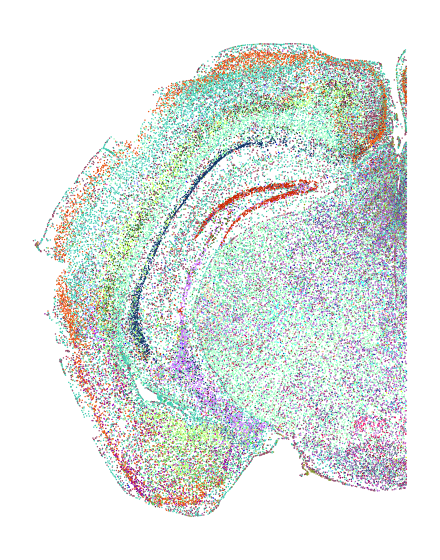

In [76]:
c = measured_imputed_adata.obs['subclass_color']
# fig, ax = plt.subplots(figsize=[5, 5])
fig = plt.figure(figsize=(2.5,3.25), dpi=200)
ax = plt.axes([0.2, 0.2, 0.8, 0.8])
ax.scatter(measured_imputed_adata.obs['ccf_z'], -1*measured_imputed_adata.obs['ccf_y'],s=1,marker='.',c=c,linewidths=0, edgecolors=None)
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout(pad=0.5, w_pad=0.1, h_pad=0.1)
plt.savefig(f"{output_dir}/Subclass_Color_Measured_Imputed.pdf", dpi=200, transparent=True,format='pdf')
plt.show()

In [77]:
Zval = measured_imputed_adata.obs['ccf_x'].mean()
Zval

7.799999999999998

Zhuang-ABCA-1.089


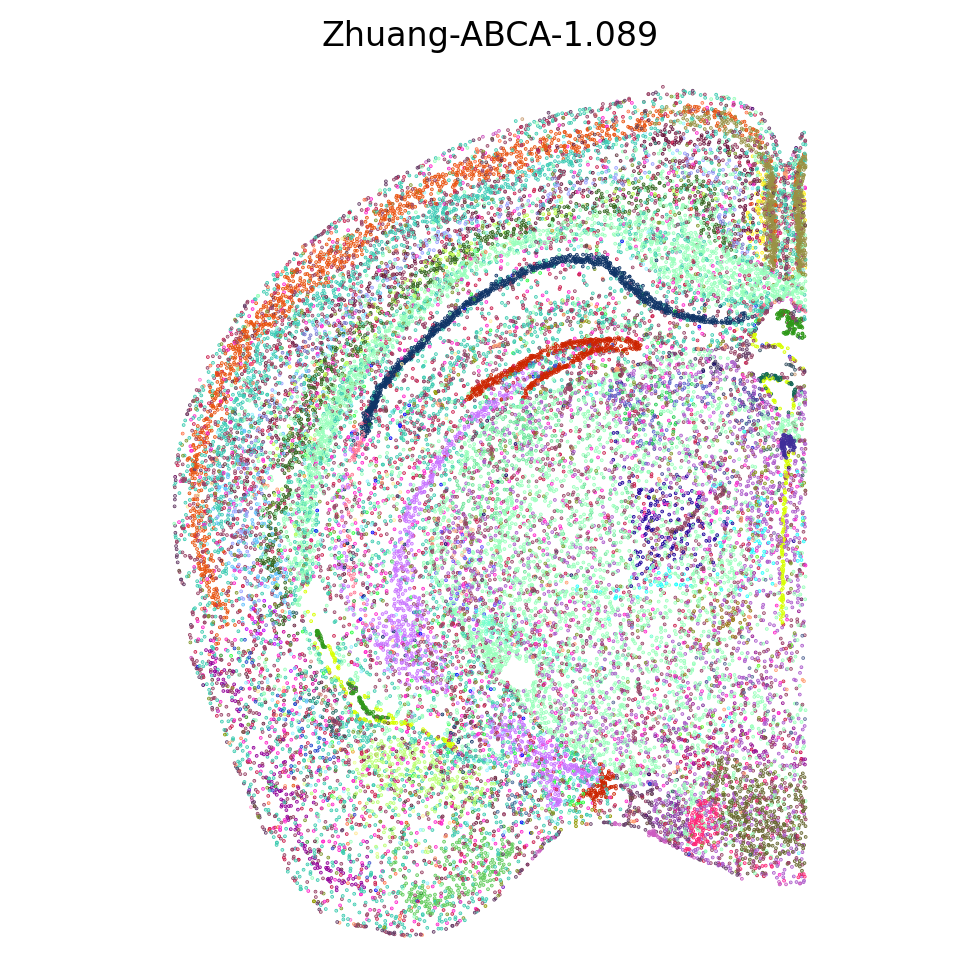

Zhuang-ABCA-1.087


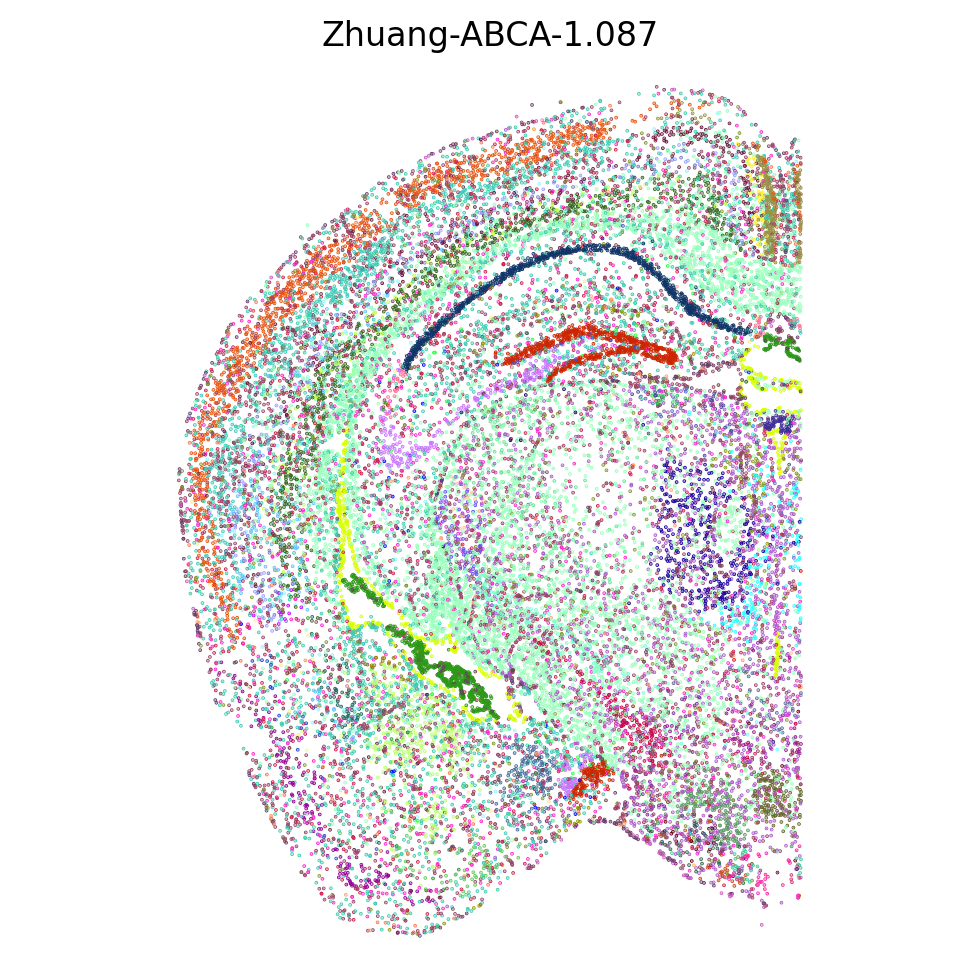

Zhuang-ABCA-1.091


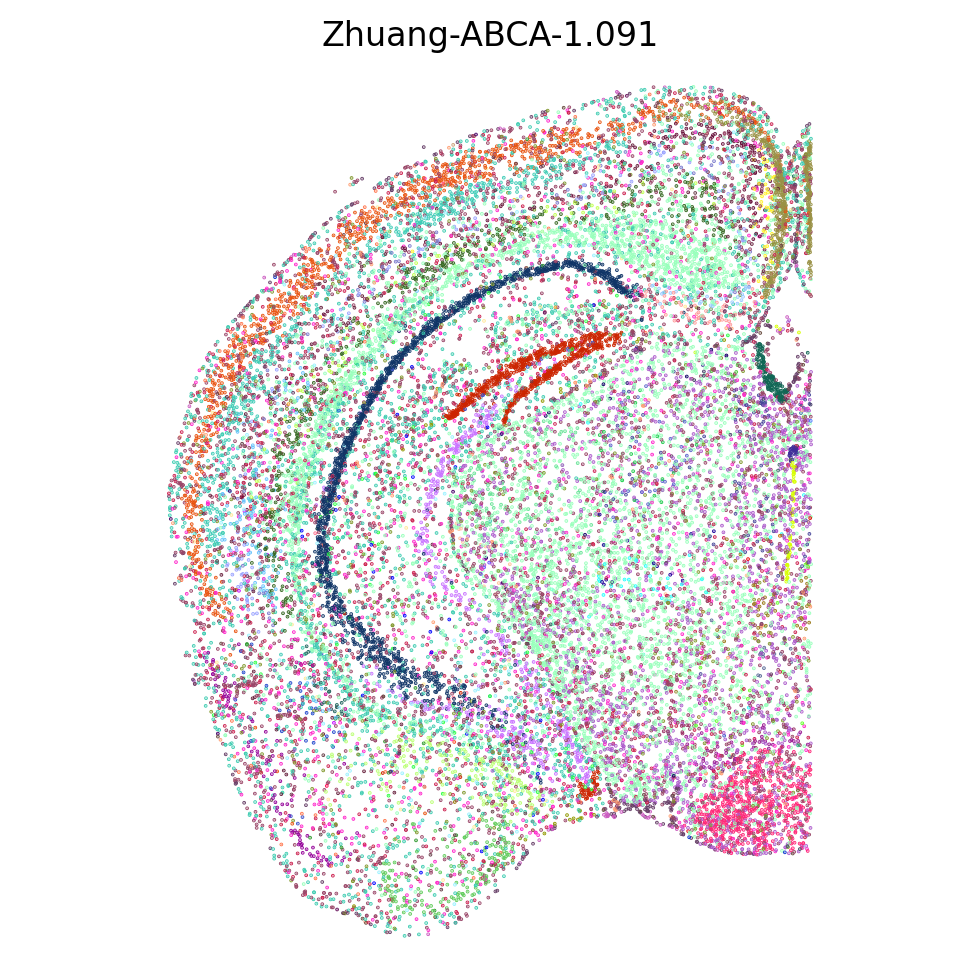

Zhuang-ABCA-1.088


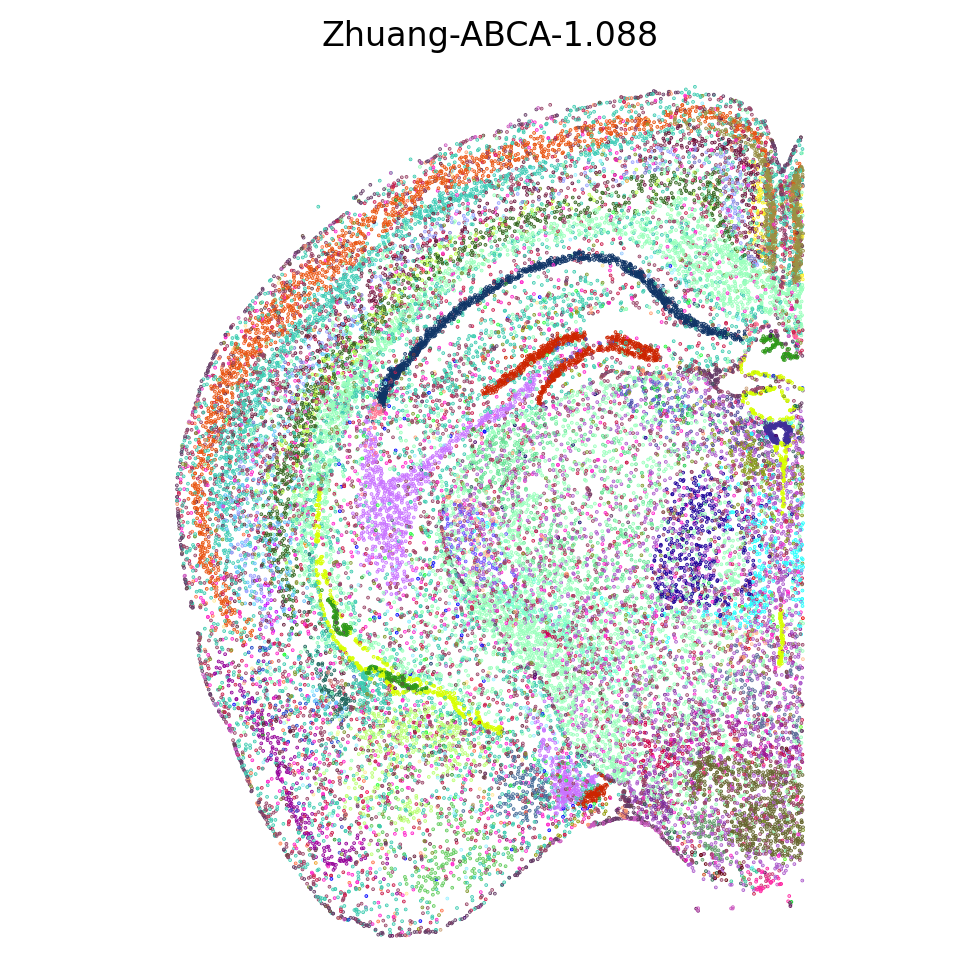

Zhuang-ABCA-1.090


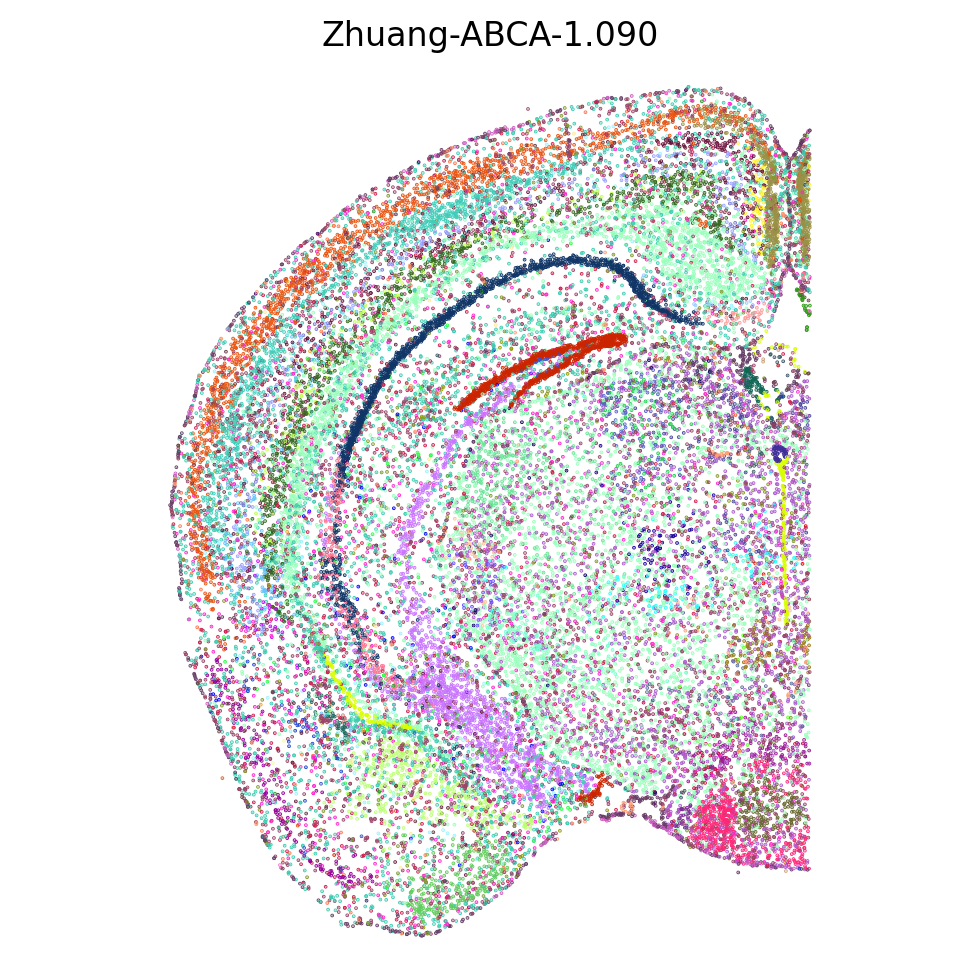

In [78]:
# Load Imputed from Zhuang 
gene_Zhuang = pd.read_csv('/scratchdata1/ExternalData/Allen_WMB_2024Mar06/metadata/Zhuang-ABCA-1/20230830/gene.csv')


Zhuang_metadata = pd.read_csv('/scratchdata1/ExternalData/Allen_WMB_2024Mar06/metadata/Zhuang-ABCA-1/20230830/views/cell_metadata_with_cluster_annotation.csv')
Zhuang_metadata.set_index('cell_label', inplace=True)


Zhuang_ccf = pd.read_csv('/scratchdata1/ExternalData/Allen_WMB_2024Mar06/metadata/Zhuang-ABCA-1-CCF/20230830/ccf_coordinates.csv')
Zhuang_ccf = Zhuang_ccf.rename(columns={'x': 'ccf_x', 'y': 'ccf_y', 'z': 'ccf_z'})
Zhuang_ccf.set_index('cell_label', inplace=True)

Zhuang_metadata = Zhuang_metadata.join(Zhuang_ccf, how='inner')

Zhuang_expression = anndata.read_h5ad('/scratchdata1/ExternalData/Allen_WMB_2024Mar06/expression_matrices/Zhuang-ABCA-1/20230830/Zhuang-ABCA-1-raw.h5ad',backed = 'r')

Zsec = np.zeros(Zhuang_metadata['brain_section_label'].nunique())
Nsec = np.zeros(Zhuang_metadata['brain_section_label'].nunique())
for i,sec in enumerate(Zhuang_metadata['brain_section_label'].unique()): 
    ix = np.flatnonzero(Zhuang_metadata['brain_section_label']==sec)
    Zsec[i] = Zhuang_metadata['ccf_x'].iloc[ix].mean()
    Nsec[i] = Zhuang_metadata['ccf_x'].iloc[ix].count()

# Find Zsec within 0.2 of Zval
close_sections = np.abs(Zsec - Zval) <= 0.25

Zhuang_sections = Zhuang_metadata['brain_section_label'].unique()[close_sections]
for Zhuang_sec in Zhuang_sections:
    Zhuang_cell_labels = Zhuang_metadata[Zhuang_metadata['brain_section_label'] == Zhuang_sec].index
    Zhuang_expression_section = Zhuang_expression[Zhuang_cell_labels, :].to_memory()
    # Zhuang_expression_section = Zhuang_expression_section[:, common_genes]

    # Add metadata columns to Zhuang_expression_section.obs
    Zhuang_expression_section.obs = Zhuang_expression_section.obs.join(
        Zhuang_metadata.loc[Zhuang_cell_labels],
        how='left',
        rsuffix='_metadata'
    ).filter(regex='^(?!.*_metadata)')
    print(Zhuang_sec)
    plt.figure(figsize=[5,5], dpi=200)
    plt.scatter(Zhuang_expression_section.obs['ccf_z'],-1*Zhuang_expression_section.obs['ccf_y'],s=0.1,c=Zhuang_expression_section.obs['subclass_color'])
    plt.title(Zhuang_sec)
    plt.axis('equal')
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    


In [79]:
Zhuang_sec = 'Zhuang-ABCA-1.090' #CHANGE Pick the nicest close section
Zhuang_cell_labels = Zhuang_metadata[Zhuang_metadata['brain_section_label'] == Zhuang_sec].index
Zhuang_expression_section = Zhuang_expression[Zhuang_cell_labels, :].to_memory()
# Zhuang_expression_section = Zhuang_expression_section[:, common_genes]

# Add metadata columns to Zhuang_expression_section.obs
Zhuang_expression_section.obs = Zhuang_expression_section.obs.join(
    Zhuang_metadata.loc[Zhuang_cell_labels],
    how='left',
    rsuffix='_metadata'
).filter(regex='^(?!.*_metadata)')

Zhuang_expression_section.obs['stage_x'] = Zhuang_expression_section.obs['ccf_z']
Zhuang_expression_section.obs['stage_y'] = Zhuang_expression_section.obs['ccf_y']
Zhuang_expression_section.write_h5ad(f"{fname.split(fname.split('/')[-1])[0]}/Zhuang_reference_section.h5ad")
reference_adata = Zhuang_expression_section
reference_adata

AnnData object with n_obs × n_vars = 32448 × 1122
    obs: 'brain_section_label', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'cluster_alias', 'x', 'y', 'z', 'subclass_confidence_score', 'cluster_confidence_score', 'high_quality_transfer', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'ccf_x', 'ccf_y', 'ccf_z', 'parcellation_index', 'stage_x', 'stage_y'
    var: 'gene_symbol'

In [80]:
Zimp_posterior= anndata.read_h5ad('/scratchdata1/ExternalData/Zhaung_WMB/WB_imputation_animal1_coronal_posterior.h5ad',backed='r')

C57BL6J-1.089


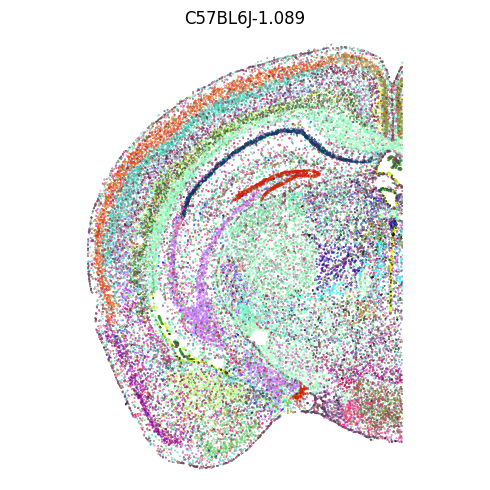

C57BL6J-1.087


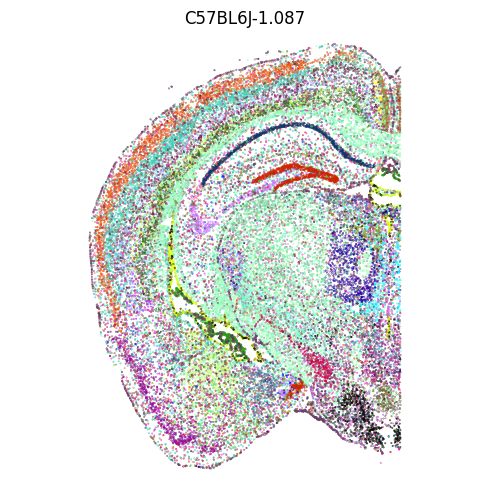

C57BL6J-1.091


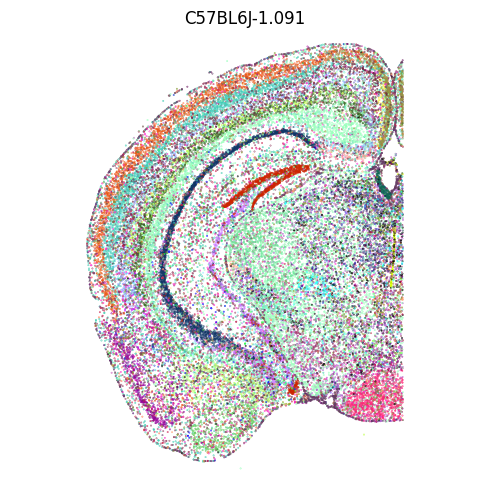

/tmp/ipykernel_68438/2304127448.py:5: RuntimeWarning: Mean of empty slice
  if np.abs((np.nanmean(Zimp_posterior.obsm['X_CCF'][m,0])/1000)-Zval)<0.25:


C57BL6J-1.088


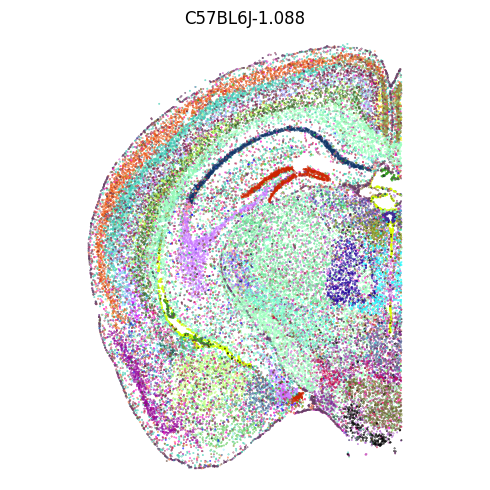

C57BL6J-1.090


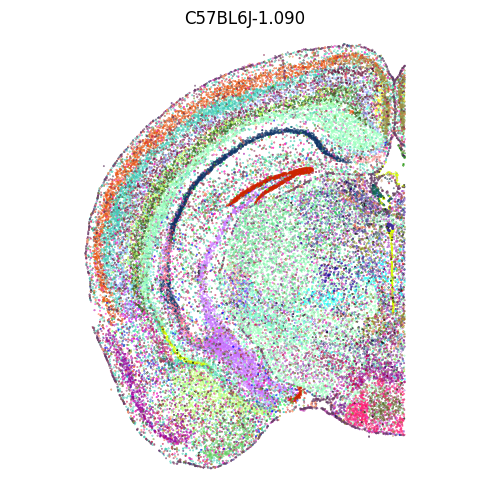

/tmp/ipykernel_68438/2304127448.py:5: RuntimeWarning: Mean of empty slice
  if np.abs((np.nanmean(Zimp_posterior.obsm['X_CCF'][m,0])/1000)-Zval)<0.25:


In [81]:
pallette = dict(zip(Zhuang_expression_section.obs['subclass'],Zhuang_expression_section.obs['subclass_color']))
cell_type_converter = {ct[4:]:ct for ct in Zhuang_expression_section.obs['subclass'].unique()}
for section in Zimp_posterior.obs['brain_section_label'].unique():
    m = Zimp_posterior.obs['brain_section_label'] == section
    if np.abs((np.nanmean(Zimp_posterior.obsm['X_CCF'][m,0])/1000)-Zval)<0.25:
        print(section)
        c=np.array(Zimp_posterior.obs['subclass_transfer'][m].map(cell_type_converter).map(pallette)).astype(str)
        c[c=='nan'] = 'k'
        plt.figure(figsize=[5,5])
        plt.scatter(Zimp_posterior.obsm['X_CCF'][m,2],-1*Zimp_posterior.obsm['X_CCF'][m,1],s=0.1,c=c)
        plt.title(section)
        plt.axis('equal')
        plt.axis('off')
        plt.tight_layout()
        plt.show()

In [82]:
section = 'C57BL6J-1.090' #CHANGE Pick the nicest close section
Zhuang_Imputed_adata = Zimp_posterior[Zimp_posterior.obs['brain_section_label']==section].to_memory().copy()
Zhuang_Imputed_adata.obs['subclass'] = Zhuang_Imputed_adata.obs['subclass_transfer'].map(cell_type_converter)
Zhuang_Imputed_adata.obs['subclass_color'] = Zhuang_Imputed_adata.obs['subclass'].map(pallette)
Zhuang_Imputed_adata.obs['stage_x'] = Zhuang_Imputed_adata.obsm['X_CCF'][:,2]
Zhuang_Imputed_adata.obs['stage_y'] = Zhuang_Imputed_adata.obsm['X_CCF'][:,1]
Zhuang_Imputed_adata.obs['ccf_z'] = Zhuang_Imputed_adata.obsm['X_CCF'][:,2]/1000
Zhuang_Imputed_adata.obs['ccf_y'] = Zhuang_Imputed_adata.obsm['X_CCF'][:,1]/1000
Zhuang_Imputed_adata.write(f"{fname.split(fname.split('/')[-1])[0]}/Zhuang_imputation_reference_section.h5ad")
reference_imputed_adata = Zhuang_Imputed_adata
reference_imputed_adata

AnnData object with n_obs × n_vars = 44914 × 32101
    obs: 'organism_ontology_term_id', 'donor_id', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'cell_type_ontology_term_id', 'assay_ontology_term_id', 'suspension_type', 'cluster_id_transfer', 'subclass_transfer', 'cluster_confidence_score', 'subclass_confidence_score', 'high_quality_transfer', 'major_brain_region', 'ccf_region_name', 'brain_section_label', 'is_primary_data', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'observation_joinid', 'subclass', 'subclass_color', 'stage_x', 'stage_y', 'ccf_z', 'ccf_y'
    var: 'gene_name', 'feature_is_filtered', 'feature_name', 'feature_reference', 'feature_biotype', 'feature_length'
    uns: 'citation', 'schema_reference', 'schema_version', 'title'
    obsm: 'X_CCF', 'X_spatial_coords', 'X_umap'

/tmp/ipykernel_68438/1718024956.py:10: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(pad=0.5, w_pad=0.1, h_pad=0.1)


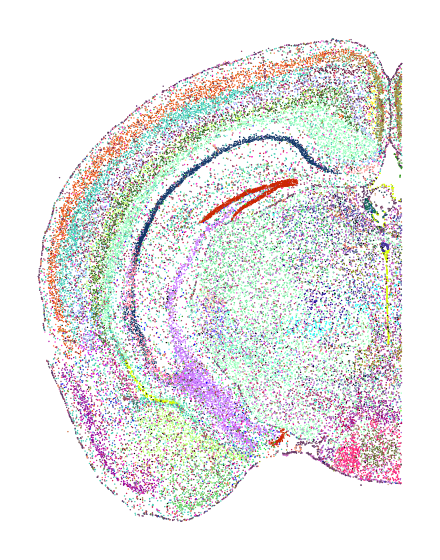

In [83]:
c = reference_imputed_adata.obs['subclass_color'].astype(str)
c[c=='nan'] = 'k'
# fig, ax = plt.subplots(figsize=[5, 5])
fig = plt.figure(figsize=(2.5,3.25),dpi=200)
ax = plt.axes([0.2, 0.2, 0.8, 0.8])
ax.scatter(reference_imputed_adata.obs['ccf_z'], -1*reference_imputed_adata.obs['ccf_y'],s=1,marker='.',c=c,linewidths=0, edgecolors=None)
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout(pad=0.5, w_pad=0.1, h_pad=0.1)
plt.savefig(f"{output_dir}/Subclass_Color_Reference.pdf", dpi=200, transparent=True,format='pdf')
plt.show()

/tmp/ipykernel_68438/3898796463.py:8: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


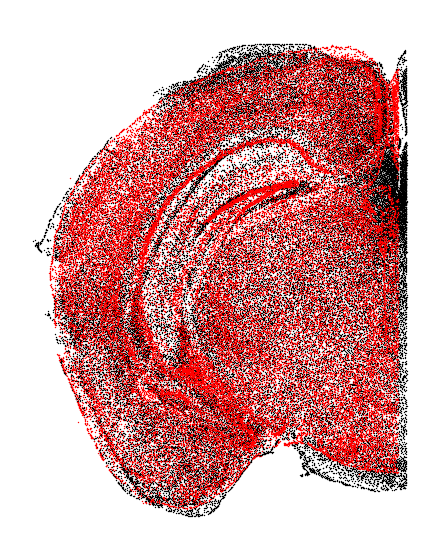

In [84]:
fig = plt.figure(figsize=(2.5,3.25),dpi=200)
ax = plt.axes([0.2, 0.2, 0.8, 0.8])
ax.scatter(measured_imputed_adata.obs['ccf_z'], -1*measured_imputed_adata.obs['ccf_y'],s=1,marker='.',c='k',linewidths=0, edgecolors=None)
ax.scatter(reference_imputed_adata.obs['ccf_z'], -1*reference_imputed_adata.obs['ccf_y'],s=1,marker='.',c='r',linewidths=0, edgecolors=None)
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout()
# plt.savefig(f"{output_dir}/Subclass_Color_Reference.pdf", dpi=200, transparent=True)
plt.show()

In [85]:
# If the overlap isnt great we might need to do more aligning using the registration point clicking

In [86]:
from scipy.sparse import issparse
def greedy_correlation_matching_of_proximal_cells(adata1_org, adata2_org, dist_thresh = 0.1,log=False):
    x_axis_label = 'ccf_y'
    y_axis_label = 'ccf_z'
    # make copies as we are going to subsample
    adata1 = adata1_org.copy()
    adata2 = adata2_org.copy()

    if issparse(adata1.X):
        adata1.X = adata1.X.toarray()
    if issparse(adata2.X):
        adata2.X = adata2.X.toarray()

    y_min = np.max([np.min(adata1.obs[x_axis_label]),np.min(adata2.obs[x_axis_label])])
    y_max = np.min([np.max(adata1.obs[x_axis_label]),np.max(adata2.obs[x_axis_label])])
    z_min = np.max([np.min(adata1.obs[y_axis_label]),np.min(adata2.obs[y_axis_label])])
    z_max = np.min([np.max(adata1.obs[y_axis_label]),np.max(adata2.obs[y_axis_label])])
    m = (adata1.obs[x_axis_label]>y_min) & (adata1.obs[x_axis_label]<y_max) & (adata1.obs[y_axis_label]>z_min) & (adata1.obs[y_axis_label]<z_max)
    adata1 = adata1[m].copy()
    m = (adata2.obs[x_axis_label]>y_min) & (adata2.obs[x_axis_label]<y_max) & (adata2.obs[y_axis_label]>z_min) & (adata2.obs[y_axis_label]<z_max)
    adata2 = adata2[m].copy()

    # ensure var paired
    shared_var = adata1.var_names.intersection(adata2.var_names)
    adata1 = adata1[:,shared_var].copy()
    adata2 = adata2[:,shared_var].copy()

    print(adata1.shape,adata2.shape)

    # Remove cells with no expression
    adata1 = adata1[adata1.X.sum(axis=1)>0,:]
    adata2 = adata2[adata2.X.sum(axis=1)>0,:]

    print(adata1.shape,adata2.shape)

     # subsample to the same size
    if adata1.shape[0]<adata2.shape[0]:
        random_indexes = np.random.choice(adata2.obs_names, size=adata1.shape[0], replace=False)
        adata2 = adata2[random_indexes]
    elif adata1.shape[0]>adata2.shape[0]:
        random_indexes = np.random.choice(adata1.obs_names, size=adata2.shape[0], replace=False)
        adata1 = adata1[random_indexes]

    G1 = adata1.X.copy()
    G2 = adata2.X.copy()

    # check for sparse matrix
    if issparse(G1):
        G1 = G1.toarray()
    if issparse(G2):
        G2 = G2.toarray()

    G1 = np.array(G1)
    G2  = np.array(G2)

    # # normalize to total counts
    # avg_sum = (G1.sum(axis=1).mean() + G2.sum(axis=1).mean())/2
    # G1 = avg_sum*G1/np.sum(G1,axis=1)[:,None]
    # G2 = avg_sum*G2/np.sum(G2,axis=1)[:,None]

    if log:
        # if np.nanmin(G1)>0:
        G1 = np.log10(G1+1)
        # if np.nanmin(G2)>0:
        G2 = np.log10(G2+1)

    # create pairing between all adata1 / adata2 points that are withint dist_thresh
    XY1 = np.array(adata1.obs[[x_axis_label,y_axis_label]])
    XY2 = np.array(adata2.obs[[x_axis_label,y_axis_label]])

    XY1 = torch.tensor(XY1)
    XY2 = torch.tensor(XY2)
    distances = torch.cdist(XY1, XY2)
    cells_ix_1,cells_ix_2 = np.where(distances < dist_thresh)
    del distances

    # Extract the relevant subsets
    G1_subset = G1[cells_ix_1,:]
    G2_subset = G2[cells_ix_2,:]

    # Calculate means
    G1_mean = np.mean(G1_subset, axis=1)[:,np.newaxis]
    G2_mean = np.mean(G2_subset, axis=1)[:,np.newaxis]

    # Calculate correlation
    numerator = np.sum((G1_subset - G1_mean) * (G2_subset - G2_mean), axis=1)
    denominator = np.sqrt(np.sum((G1_subset - G1_mean)**2, axis=1) * np.sum((G2_subset - G2_mean)**2, axis=1))

    # Handle potential division by zero
    correlations = np.where(denominator != 0, numerator / denominator, 0)

    # Sort correlations in descending order
    sorted_indices = np.argsort(-correlations)
    
    # Initialize sets to keep track of matched rows and columns
    matched_1 = set()
    matched_2 = set()

    # Single pass through the sorted correlations
    good_idxes = []
    for idx in tqdm(sorted_indices):
        c1 = cells_ix_1[idx]
        c2 = cells_ix_2[idx]
        
        # If both row and column are unmatched, add to matches
        if c1 not in matched_1: 
            if  c2 not in matched_2:
                matched_1.add(c1)
                matched_2.add(c2)
                good_idxes.append(idx)
    good_idxes = np.array(good_idxes)
    matched_1 = np.array(cells_ix_1[good_idxes])
    matched_2 = np.array(cells_ix_2[good_idxes])
    cell_correlations = np.array(correlations[good_idxes])

    if issparse(adata1.X):
        paired_adata = anndata.AnnData(X=adata1.X.toarray()[matched_1,:].copy(),var=adata1.var)
        paired_adata.layers['G1'] = np.array(adata1.X.toarray()[matched_1,:].copy())
    else:
        paired_adata = anndata.AnnData(X=adata1.X[matched_1,:].copy(),var=adata1.var)
        paired_adata.layers['G1'] = np.array(adata1.X[matched_1,:].copy())
    if issparse(adata2.X):
        paired_adata.layers['G2'] = np.array(adata2.X.toarray()[matched_2,:].copy())
    else:
        paired_adata.layers['G2'] = np.array(adata2.X[matched_2,:].copy())
    paired_adata.var['G1'] = adata1.var_names
    paired_adata.var['G2'] = adata2.var_names
    paired_adata.obs['G1_cells'] = np.array(adata1.obs.index)[matched_1]
    paired_adata.obs['G2_cells'] = np.array(adata2.obs.index)[matched_2]
    paired_adata.obs['G1_aligned_ccf_y'] = adata1.obs[x_axis_label].values[matched_1]
    paired_adata.obs['G1_aligned_ccf_z'] = adata1.obs[y_axis_label].values[matched_1]
    paired_adata.obs['G2_aligned_ccf_y'] = adata2.obs[x_axis_label].values[matched_2]
    paired_adata.obs['G2_aligned_ccf_z'] = adata2.obs[y_axis_label].values[matched_2]

    print(paired_adata)

    # Extract the relevant subsets
    G1_subset = np.array(paired_adata.layers['G1']).copy().T#G1_matched.numpy().T
    G2_subset = np.array(paired_adata.layers['G2']).copy().T#G2_matched.numpy().T

    if log:
        G1_subset = np.log10(G1_subset + 1)
        G2_subset = np.log10(G2_subset + 1)
    # Calculate means
    G1_mean = np.mean(G1_subset, axis=1)[:,np.newaxis]
    G2_mean = np.mean(G2_subset, axis=1)[:,np.newaxis]

    # Calculate correlation
    numerator = np.sum((G1_subset - G1_mean) * (G2_subset - G2_mean), axis=1)
    denominator = np.sqrt(np.sum((G1_subset - G1_mean)**2, axis=1) * np.sum((G2_subset - G2_mean)**2, axis=1))

    # Handle potential division by zero
    gene_correlations = np.where(denominator != 0, numerator / denominator, 0)

    cell_correlations = np.array(cell_correlations)#.numpy()
    gene_correlations = np.array(gene_correlations)#.numpy()
    gene_mu = np.mean(paired_adata.layers['G1'],axis=0)
    genes = adata1.var_names

    paired_adata.obs['correlation'] = cell_correlations
    paired_adata.var['correlation'] = gene_correlations
    
    return cell_correlations, gene_correlations, gene_mu, genes,paired_adata

In [87]:
" Filter down to good genes"
common_genes = anndata.read_h5ad('/scratchdata1/MouseBrainAtlases_V7/AnalysisNotebooks/Allen_7.8_common_genes.h5ad',backed='r').var_names
common_genes = [i for i in common_genes if i in reference_imputed_adata.var_names]
common_genes = [i for i in common_genes if i in measured_imputed_adata.var_names]
print(f"n_common_genes: {len(common_genes)}")

n_common_genes: 336


In [88]:
cell_correlations, gene_correlations, gene_mu, genes,paired_adata = greedy_correlation_matching_of_proximal_cells(measured_imputed_adata[:,common_genes],reference_imputed_adata[:,common_genes], dist_thresh = 0.1,log=True) 

(53286, 336) (44643, 336)
(53286, 336) (44643, 336)


100%|██████████| 2017451/2017451 [00:01<00:00, 1285444.20it/s]


AnnData object with n_obs × n_vars = 36815 × 336
    obs: 'G1_cells', 'G2_cells', 'G1_aligned_ccf_y', 'G1_aligned_ccf_z', 'G2_aligned_ccf_y', 'G2_aligned_ccf_z'
    var: 'G1', 'G2'
    layers: 'G1', 'G2'


/tmp/ipykernel_68438/2653434391.py:11: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


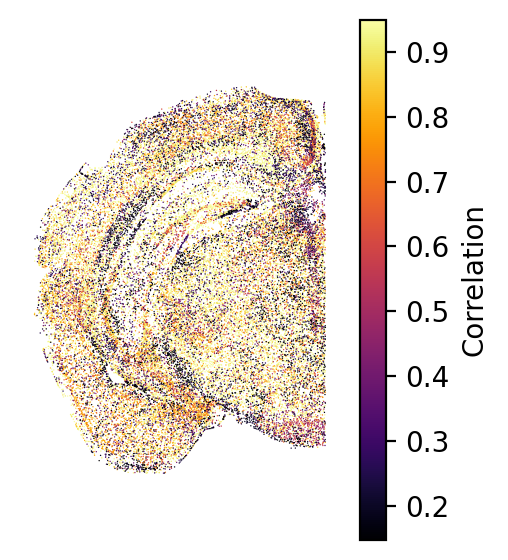

In [89]:
c = paired_adata.obs['correlation']
vmin,vmax = np.percentile(c, [5,95])
fig = plt.figure(figsize=(2.5,3.25),dpi=200)
ax = plt.axes([0.2, 0.2, 0.8, 0.8])
im = ax.scatter(paired_adata.obs['G1_aligned_ccf_z'], -1*paired_adata.obs['G1_aligned_ccf_y'],s=1,marker='.',c=c,linewidths=0, edgecolors=None,vmin=vmin,vmax=vmax,cmap='inferno')
cbar = plt.colorbar(im,ax=ax)
cbar.set_label('Correlation')
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout()
# plt.savefig(f"{output_dir}/Subclass_Color_Reference.pdf", dpi=200, transparent=True)
plt.show()

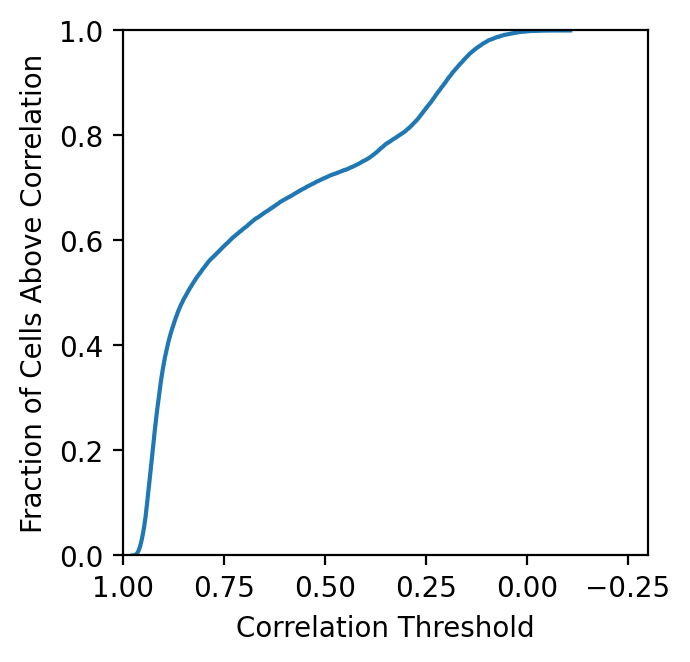

In [90]:
plt.figure(figsize=[3.5, 3.5],dpi=200)
plt.axes([0.2, 0.2, 0.75, 0.75])
correlations = paired_adata.obs['correlation'].values
correlations = correlations[~np.isnan(correlations)]
y = np.arange(correlations.shape[0]) / correlations.shape[0]
x = np.sort(correlations)[::-1]

line, = plt.plot(x, y)
plt.grid(False)
plt.xlabel('Correlation Threshold')
plt.ylabel('Fraction of Cells Above Correlation')
plt.xlim((1,-0.3))
plt.ylim((0,1))
plt.savefig(f"{output_dir}/pseudopaired_validation.pdf", dpi=200, transparent=True,format='pdf')
plt.show()

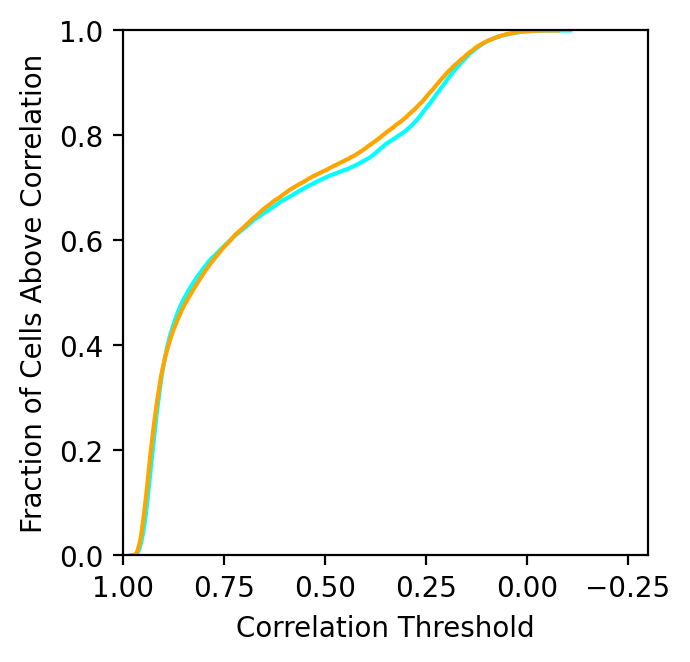

In [91]:
plt.figure(figsize=[3.5, 3.5],dpi=200)
plt.axes([0.2, 0.2, 0.75, 0.75])
correlations = paired_adata.obs['correlation'].values
correlations = correlations[~np.isnan(correlations)]
y = np.arange(correlations.shape[0]) / correlations.shape[0]
x = np.sort(correlations)[::-1]
line, = plt.plot(x, y,c='cyan')
old_paired_adata = anndata.read_h5ad('/scratchdata1/MouseBrainAtlases_V7/AnalysisNotebooks/Zhuang_Imputed_7_WTM01_7_paired.h5ad',backed='r')
correlations = old_paired_adata.obs['correlation'].values
correlations = correlations[~np.isnan(correlations)]
y = np.arange(correlations.shape[0]) / correlations.shape[0]
x = np.sort(correlations)[::-1]
line, = plt.plot(x, y,c='orange')
plt.grid(False)
plt.xlabel('Correlation Threshold')
plt.ylabel('Fraction of Cells Above Correlation')
plt.xlim((1,-0.3))
plt.ylim((0,1))
plt.savefig(f"{output_dir}/pseudopaired_validation_w_dpnmf.pdf", dpi=200, transparent=True,format='pdf')
plt.show()

In [92]:
measured_adata_path = '/purpledata/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/anndata/WellB-Section1_MLP_full_decoded_anndata.h5ad'
adata = anndata.read_h5ad(measured_adata_path)
adata = adata[adata.obs['ccf_z']<6]
adata


View of AnnData object with n_obs × n_vars = 56100 × 18
    obs: 'label', 'stage_x', 'stage_y', 'image_x', 'image_y', 'image_idx', 'size', 'section_index', 'dapi', 'sum', 'dataset', 'well', 'ccf_x', 'ccf_y', 'ccf_z', 'in_large_comp', 'neuron', 'neuron_color', 'subclass', 'subclass_color', 'reference_neighbor_0', 'reference_neighbor_1', 'reference_neighbor_2', 'reference_neighbor_3', 'reference_neighbor_4', 'reference_neighbor_5', 'reference_neighbor_6', 'reference_neighbor_7', 'reference_neighbor_8', 'reference_neighbor_9', 'reference_neighbor_10', 'reference_neighbor_11', 'reference_neighbor_12', 'reference_neighbor_13', 'reference_neighbor_14'
    layers: 'classification_space', 'harmonized', 'harmonized_classification_space', 'normalized', 'nuc_mask', 'nuc_processed_vectors', 'nuc_raw', 'processed_vectors', 'raw', 'zscored'

/tmp/ipykernel_68438/1070945315.py:9: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


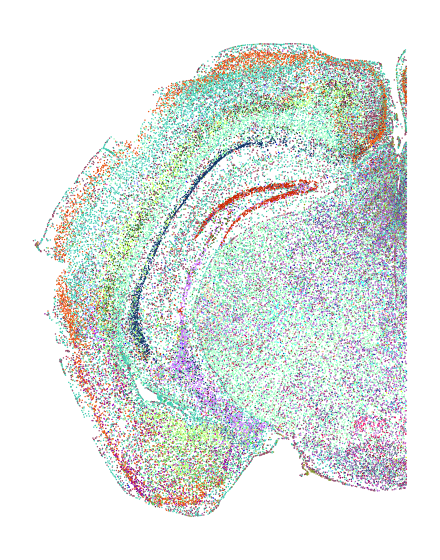

In [93]:
c = adata.obs['subclass_color']
# fig, ax = plt.subplots(figsize=[5, 5])
fig = plt.figure(figsize=(2.5,3.25),dpi=200)
ax = plt.axes([0.2, 0.2, 0.8, 0.8])
ax.scatter(adata.obs['ccf_z'], -1*adata.obs['ccf_y'],s=1,marker='.',c=c,linewidths=0, edgecolors=None)
ax.grid(False)
ax.axis('equal')
ax.axis('off')
plt.tight_layout()
plt.savefig(f"{output_dir}/Subclass_Color.pdf", dpi=200, transparent=True,format='pdf',bbox_inches='tight')
plt.show()

In [94]:
adata

View of AnnData object with n_obs × n_vars = 56100 × 18
    obs: 'label', 'stage_x', 'stage_y', 'image_x', 'image_y', 'image_idx', 'size', 'section_index', 'dapi', 'sum', 'dataset', 'well', 'ccf_x', 'ccf_y', 'ccf_z', 'in_large_comp', 'neuron', 'neuron_color', 'subclass', 'subclass_color', 'reference_neighbor_0', 'reference_neighbor_1', 'reference_neighbor_2', 'reference_neighbor_3', 'reference_neighbor_4', 'reference_neighbor_5', 'reference_neighbor_6', 'reference_neighbor_7', 'reference_neighbor_8', 'reference_neighbor_9', 'reference_neighbor_10', 'reference_neighbor_11', 'reference_neighbor_12', 'reference_neighbor_13', 'reference_neighbor_14'
    layers: 'classification_space', 'harmonized', 'harmonized_classification_space', 'normalized', 'nuc_mask', 'nuc_processed_vectors', 'nuc_raw', 'processed_vectors', 'raw', 'zscored'

In [95]:
!ls /scratchdata1/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/anndata/

anndata.h5ad
imputation_reference_adata.h5ad
WellB-Section1_LR_full_decoded_anndata.h5ad
WellB-Section1_LR_likelihood_only_decoded_anndata.h5ad
WellB-Section1_MLP_full_decoded_anndata.h5ad
WellB-Section1_MLP_full_decoded_anndata_imputed.h5ad
WellB-Section1_MLP_likelihood_only_decoded_anndata.h5ad
Zhuang_imputation_reference_section.h5ad
Zhuang_reference_section.h5ad


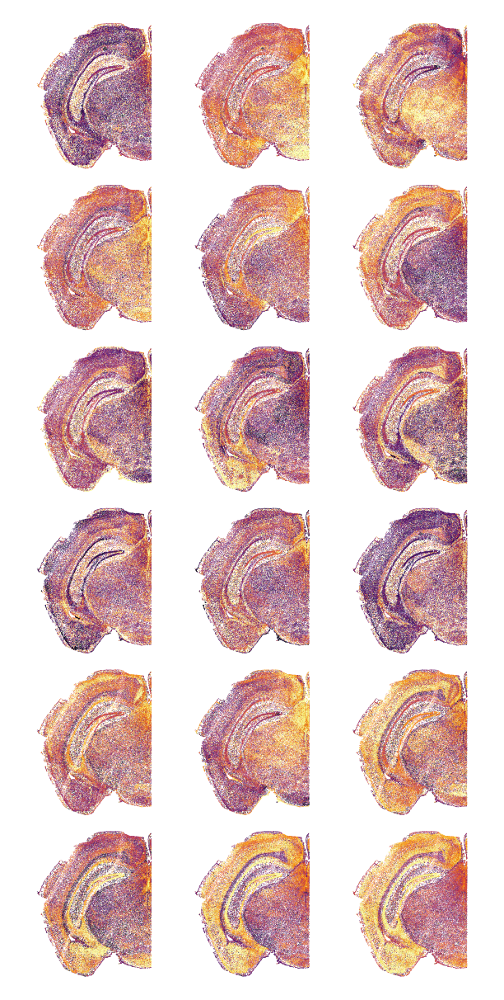

In [96]:
n_bits = adata.X.shape[1]
n_rows, n_cols = 6,3
fig, axs = plt.subplots(n_rows, n_cols, figsize=[3, 6],dpi=200)
axs = axs.ravel()
for i in range(n_bits):
    if i >= n_rows * n_cols:
        break
    c = adata.layers['normalized'][:,i].copy()
    vmin,vmax = np.percentile(c, [5,95])
    order = np.argsort(c)
    ax = axs[i]
    ax.scatter(adata.obs['ccf_z'][order], -1*adata.obs['ccf_y'][order],s=0.25,marker='.',c=c[order], vmin=vmin, vmax=vmax, cmap='inferno',linewidths=0, edgecolors=None, rasterized=True)
    ax.grid(False)
    ax.axis('off')
    ax.axis('equal')
for i in range(n_bits, n_rows * n_cols):
    axs[i].axis('off')
plt.tight_layout(pad=0.5, w_pad=0.1, h_pad=0.1)
plt.savefig(f"{output_dir}/Section_3x6.pdf", dpi=200, transparent=True,format='pdf',bbox_inches='tight')
plt.show()

/tmp/ipykernel_68438/1992329053.py:17: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


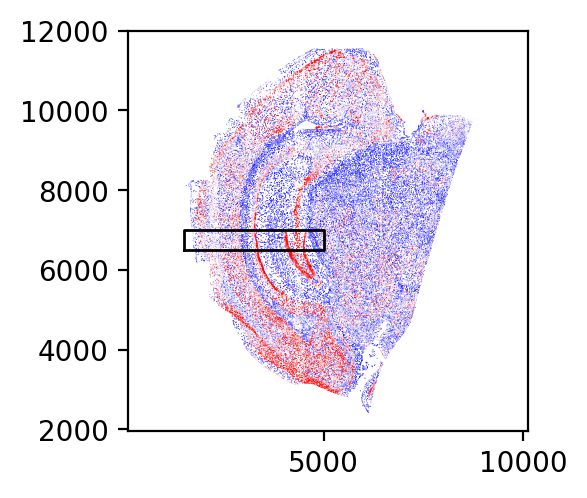

In [97]:
c = adata.layers['raw'].sum(axis=1)
vmin,vmax = np.percentile(c, [5,95])

order = np.argsort(c)
fig = plt.figure(figsize=(2.5,2.5),dpi=200)
ax = plt.axes([0.2, 0.2, 0.8, 0.8])
ax.scatter(adata.obs['stage_x'][order], adata.obs['stage_y'][order],s=0.5,marker='.',c=c[order], vmin=vmin, vmax=vmax, cmap='bwr',linewidths=0, edgecolors=None)
x_min = 1500
x_max = 5000
y_min = 6500
y_max = 7000

ax.plot([x_min,x_min,x_max,x_max,x_min],[y_min,y_max,y_max,y_min,y_min],color='black',linewidth=1)
ax.grid(False)
# ax.axis('off')
ax.axis('equal')
plt.tight_layout()
plt.show()

/tmp/ipykernel_68438/2013988782.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap('inferno', 256)


torch.Size([14947, 12374])
n_cells: 1673


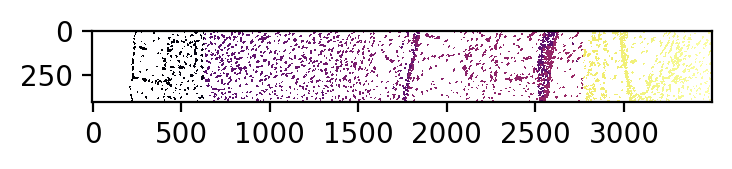

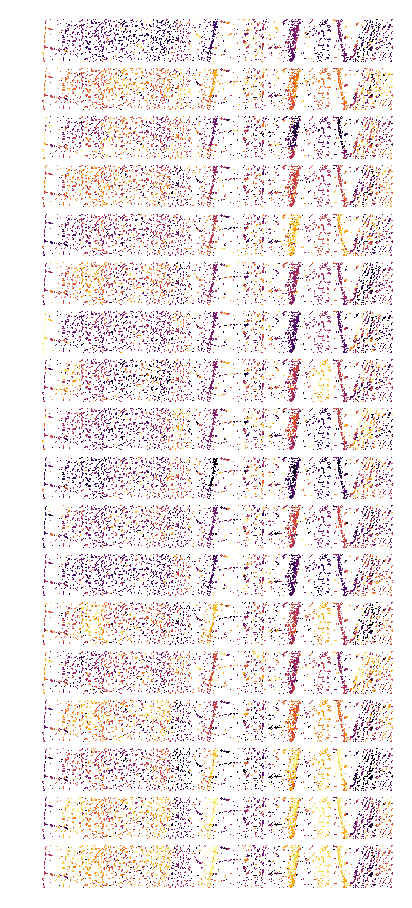

In [98]:
from matplotlib.colors import LinearSegmentedColormap
# Create a custom colormap based on 'jet'
jet = plt.cm.get_cmap('inferno', 256)
new_colors = jet(np.linspace(0, 1, 256))
new_colors[0] = np.array([1,1,1, 0])  # Change the first color to black (RGBA)
custom_jet = LinearSegmentedColormap.from_list('custom_jet', new_colors)
# import torch.nn.functional as F
mask_path = '/purpledata/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/mask/mask.pt'
mask = torch.load(mask_path)
print(mask.shape)
downsampled_mask = mask.numpy().astype(int)
x_min = 1500
x_max = 5000
y_min = 6500+50
y_max = 7000-50
m = (adata.obs['stage_x']>x_min) & (adata.obs['stage_x']<x_max) & (adata.obs['stage_y']>y_min) & (adata.obs['stage_y']<y_max)
downsampled_mask = downsampled_mask[x_min:x_max,y_min:y_max]
del mask
mask_x,mask_y = np.where(downsampled_mask>0)
mask_idxes = downsampled_mask[mask_x,mask_y]
print(f"n_cells: {m.sum()}")
temp_adata = adata[m].copy()


plt.figure(figsize=[4,2],dpi=200)
plt.imshow(downsampled_mask.T,cmap=custom_jet, interpolation='nearest')
plt.grid(False)
plt.show()

fig,axs = plt.subplots(18,1,figsize=(2,4.5),dpi=200)
axs = axs.ravel()
for bit in range(adata.layers['normalized'].shape[1]):
    ax = axs[bit]
    # print(bit)
    c = temp_adata.layers['normalized'][:,bit].copy()
    vmin,vmax = np.percentile(c[c>0], (5, 95))
    c = (np.clip((c-vmin)/(vmax-vmin), 0, 1)*255).astype(int)+1
    converter = dict(zip(np.array(temp_adata.obs['label']).astype(int),c))
    new_values = np.array(pd.Series(mask_idxes).map(converter).values)
    new_values[np.isnan(new_values)] = 0
    img = np.zeros_like(downsampled_mask).astype(float)
    img[mask_x,mask_y] = new_values
    ax.imshow(img.T,cmap=custom_jet,vmin=0,vmax=256, interpolation='nearest')
    ax.grid(False)
    ax.axis('off')
plt.tight_layout(pad=0.5, w_pad=0.1, h_pad=0.1)
plt.savefig(f"{output_dir}/Cortex_Zoom.pdf", dpi=200, transparent=True,format='pdf',bbox_inches='tight')
plt.show()


/tmp/ipykernel_68438/1384300175.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet = plt.cm.get_cmap('inferno', 256)


torch.Size([14947, 12374])
n_cells: 1673


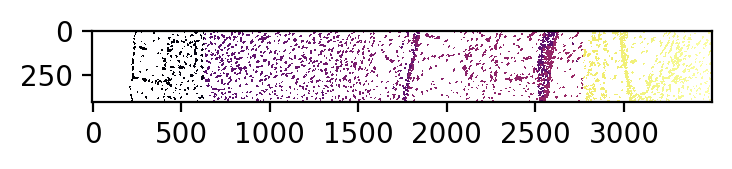

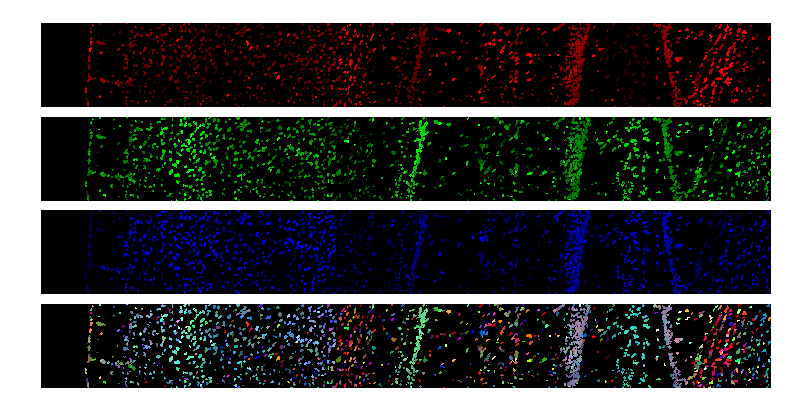

In [99]:
from matplotlib.colors import LinearSegmentedColormap
# Create a custom colormap based on 'jet'
jet = plt.cm.get_cmap('inferno', 256)
new_colors = jet(np.linspace(0, 1, 256))
new_colors[0] = np.array([1,1,1, 0])  # Change the first color to black (RGBA)
custom_jet = LinearSegmentedColormap.from_list('custom_jet', new_colors)
# import torch.nn.functional as F
mask_path = '/purpledata/Images2025/Haley/CIPHER/RNA_WTF4S7R3.B_2025Sep08/Processing_2025Sep11/WellB-Section1/mask/mask.pt'
mask = torch.load(mask_path)
print(mask.shape)
downsampled_mask = mask.numpy().astype(int)
x_min = 1500
x_max = 5000
y_min = 6500+50
y_max = 7000-50
m = (adata.obs['stage_x']>x_min) & (adata.obs['stage_x']<x_max) & (adata.obs['stage_y']>y_min) & (adata.obs['stage_y']<y_max)
downsampled_mask = downsampled_mask[x_min:x_max,y_min:y_max].T
del mask
mask_x,mask_y = np.where(downsampled_mask>0)
mask_idxes = downsampled_mask[mask_x,mask_y]
print(f"n_cells: {m.sum()}")
temp_adata = adata[m].copy()


plt.figure(figsize=[4,2],dpi=200)
plt.imshow(downsampled_mask,cmap=custom_jet, interpolation='nearest')
plt.grid(False)
plt.show()
rgb_mask = np.zeros((downsampled_mask.shape[0],downsampled_mask.shape[1],3))
counter = 0
first = True
fig,axs = plt.subplots(4,1,figsize=(4,2),dpi=200)
axs = axs.ravel()
# for bit in [7,8,12]:
for bit in [8,12,14]:
    # print(bit)
    c = temp_adata.layers['normalized'][:,bit].copy()
    vmin,vmax = np.percentile(c[c>0], (5, 95))
    c = (np.clip((c-vmin)/(vmax-vmin), 0, 1)*255).astype(int)
    converter = dict(zip(np.array(temp_adata.obs['label']).astype(int),c))
    new_values = np.array(pd.Series(mask_idxes).map(converter).values)
    new_values[np.isnan(new_values)] = 0
    # img = np.zeros_like(downsampled_mask).astype(float)
    # img[mask_x,mask_y] = new_values
    rgb_mask[mask_x,mask_y,counter] = new_values
    # img = img[:,img.mean(0)>0.01]
    # img = img[img.mean(1)>0.01]
    if first:
        temp = np.zeros((downsampled_mask.shape[0],downsampled_mask.shape[1],3))
        temp[mask_x,mask_y,counter] = new_values
        # plt.figure(figsize=[4,2],dpi=200)
        ax = axs[counter]
        im = ax.imshow(temp.astype(float)/temp.max(), interpolation='nearest')
        # plt.grid(False)
        ax.axis('equal')
        ax.axis('off')
        # plt.show()
    if counter==2:
        # first = False
        counter = 0
        ax = axs[3]
        # plt.figure(figsize=[4,2],dpi=200)
        ax.imshow(rgb_mask.astype(float)/rgb_mask.max(), interpolation='nearest')
        ax.axis('equal')
        # plt.grid(False)
        ax.axis('off')
        plt.tight_layout(pad=0.5, w_pad=0.1, h_pad=0.1)
        plt.savefig(f"{output_dir}/Cortex_Zoom_RGB.pdf", dpi=200, transparent=True,format='pdf',bbox_inches='tight')
        plt.show()
        # fig,axs = plt.subplots(4,1,figsize=(6,4),dpi=200)
        # axs = axs.ravel()
    else:
        counter += 1
    # break


# Turn Panels into Figures

In [100]:
figures = {}
# Figure 1 - CIPHER
figures['Figure_1'] = {
    'A':f"{output_dir}/CIPHER.pdf"
    }
# Figure 2 - Loss Function Effects
figures['Figure_2'] = {
    'A':f"{output_dir}/loss_functions.pdf",
    'B':f"{output_dir}/Need_for_Measurability_Accuracy.pdf",
    'C':f"{output_dir}/Need_for_Measurability_Separation.pdf",
    'D':f"{output_dir}/Need_for_Measurability_Dyanmic_Fold.pdf",
    }
# Figure 3 - Decoder Complexity
figures['Figure_3'] = {
    'A':f"{output_dir}/hidden_layers.pdf",
    'B':f"{output_dir}/Decoder_Complexity_Bit_Number_Tradeoff_Accuracy.pdf",
    'C':f"{output_dir}/Decoder_Complexity_Bit_Number_Tradeoff_Separation.pdf",
    'D':f"{output_dir}/Decoder_Complexity_Bit_Number_Tradeoff_Dyanmic_Fold.pdf",
    }
# Figure 4 - Experimental Tradeoffs
figures['Figure_4'] = {
    'A':f"{output_dir}/Brightness_Tradeoff.pdf",
    'B':f"{output_dir}/Probe_Number_Tradeoff.pdf",
    }
# Figure 5 - Simulation Results
figures['Figure_5'] = {
    'A':f"{output_dir}/Cell_Type_Separability_Histogram.pdf",
    'B':f"{output_dir}/Simulation_cell_typeaccuracy.pdf",
    'C':f"{output_dir}/Dynamic_Range_Brightness_Usage.pdf",
    'D':f"{output_dir}/Simulation_accuracy.pdf",
    }
# Figure 6 - Experimental Results
figures['Figure_6'] = {
    'A':f"{output_dir}/Subclass_Color_Measured_Imputed.pdf",
    'B':f"{output_dir}/Subclass_Color_Reference.pdf",
    'C':f"{output_dir}/pseudopaired_validation.pdf",
    'D':f"{output_dir}/Section_3x6.pdf",
    'E':f"{output_dir}/Cortex_Zoom.pdf",
    }
# Figure 7 - Application to other datasets
figures['Figure_7'] = {
    'A':f"{output_dir}/Dev_Mouse_Bit_Number.pdf",
    'B':f"{output_dir}/Dev_Mouse_P_Type_Heatmap.pdf",
    'C':f"{output_dir}/Lymph_Bit_Number.pdf",
    'D':f"{output_dir}/Lymph_Bit_Number_projection_space_density.pdf",
    }

figures

{'Figure_1': {'A': '/home/zach/PythonRepos/Design/Design/Results/Figures/CIPHER.pdf'},
 'Figure_2': {'A': '/home/zach/PythonRepos/Design/Design/Results/Figures/loss_functions.pdf',
  'B': '/home/zach/PythonRepos/Design/Design/Results/Figures/Need_for_Measurability_Accuracy.pdf',
  'C': '/home/zach/PythonRepos/Design/Design/Results/Figures/Need_for_Measurability_Separation.pdf',
  'D': '/home/zach/PythonRepos/Design/Design/Results/Figures/Need_for_Measurability_Dyanmic_Fold.pdf'},
 'Figure_3': {'A': '/home/zach/PythonRepos/Design/Design/Results/Figures/hidden_layers.pdf',
  'B': '/home/zach/PythonRepos/Design/Design/Results/Figures/Decoder_Complexity_Bit_Number_Tradeoff_Accuracy.pdf',
  'C': '/home/zach/PythonRepos/Design/Design/Results/Figures/Decoder_Complexity_Bit_Number_Tradeoff_Separation.pdf',
  'D': '/home/zach/PythonRepos/Design/Design/Results/Figures/Decoder_Complexity_Bit_Number_Tradeoff_Dyanmic_Fold.pdf'},
 'Figure_4': {'A': '/home/zach/PythonRepos/Design/Design/Results/Figur

In [ ]:
Figure 1: The CIPHER Framework for End-to-End Experimental Design.(A) Schematic overview of the CIPHER (Cell Identity Projection using Hybridization Encoding Rules) workflow. The model learns an optimal encoding matrix ($E$) from single-cell RNA-seq gene expression data ($X$) to project cell identities into a low-dimensional latent space ($P$). This latent space represents the aggregate optical signals measured in situ using FISH. A decoder ($D$) is simultaneously trained to reconstruct cell type identities ($C$) from these latent signals.(B) Breakdown of the composite loss function used during training. The total loss minimizes error by balancing three key components: Hybridization Loss ($L_H$), enforcing biophysical constraints on probe binding; Measurability Loss ($L_M$), ensuring signals fall within the dynamic range of the imaging hardware; and Accuracy Loss ($L_A$), maximizing the classification performance of the decoder.(C) Architecture of the neural network showing the encoder and decoder modules. The encoder maps high-dimensional gene expression to the low-dimensional bit code, while the decoder (with variable hidden layer complexity $h$) reconstructs cell types from the noisy, constrained latent representation.

Figure 2: Optimization of Bit Number and Encoding Constraints.(A) Classification accuracy as a function of the number of bits (imaging rounds/channels) in the encoding. Performance generally plateaus as bit capacity increases.(B) Trade-off curve showing accuracy when optimizing for classification performance alone, neglecting experimental constraints.(C) Impact of incorporating gene constraints on the bit number trade-off, showing the performance penalty incurred by limiting the gene pool.(D) Performance profile when hybridization constraints are relaxed, illustrating the theoretical maximum accuracy versus the experimentally feasible accuracy.(E) Analysis of the trade-off between bit number and the dynamic fold change of the signal, highlighting the balance between signal robustness and encoding capacity.

Figure 3: Decoder Complexity and Training Dynamics.(A) Classification accuracy as a function of training iterations, showing the convergence of the CIPHER model.(B) Impact of decoder complexity (depth and width of the neural network) on the final classification accuracy.(C) Joint trade-off analysis between bit number and decoder complexity, identifying the minimal decoding architecture required to saturate performance for a given code length.

Figure 4: Biophysical Constraints and Experimental Feasibility.(A) Brightness trade-off curve. The plot shows how enforcing higher minimum signal brightness (for easier detection) impacts the ability to resolve cell types.(B) Probe number trade-off. The relationship between the total number of probes used in the experiment and the resulting classification accuracy, guiding the selection of cost-effective probe sets.

Figure 5: In Silico Evaluation of Latent Space Properties.(A) Histogram of cell type separability in the optimized latent space. CIPHER increases the distance between distinct cell types compared to baselines.(B) Per-class classification accuracy in simulation, showing high performance across diverse cell types.(C) Usage of the available dynamic range and brightness levels by the optimized encoding, demonstrating efficient utilization of the imaging capacity.(D) Overall simulation accuracy summary, comparing CIPHER against standard dimensionality reduction and encoding methods.

Figure 6: In Situ Validation and Experimental Results.(A) Comparison of measured in situ signal distributions versus imputed values for distinct cell subclasses, demonstrating the predictive power of the model.(B) Reference color plots showing the expected signal signatures for key cell subclasses.(C) Pseudo-paired validation comparing cell type calls from CIPHER's aggregate measurements against ground-truth annotations from scRNA-seq.(D) Reconstructed spatial map of cell types in a large-scale ($3 \times 6$ mm) tissue section.(E) High-resolution zoom of the cortex from the tissue section in (D), revealing the spatial organization and laminar structure of identified cell types.

Figure 7: Generalizability to Diverse Tissues and Organisms.(A) Optimization of bit number for a developing mouse brain dataset, showing the method's applicability to dynamic developmental stages.(B) Heatmap of cell type classification performance in the developing mouse brain.(C) Bit number optimization curve for a lymph node dataset, demonstrating generalizability to non-neural tissues.(D) Density of cell types in the projection space for the lymph node dataset, visualizing the structure of the learned encoding in a different biological context.